In [30]:
from os.path import join
import os

from lxml import etree
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

%matplotlib inline

In [78]:
path_eval_xml = '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw1/full_eval.xml'
eval_result_tree = etree.parse(path_eval_xml)

In [79]:
print(etree.tostring(eval_result_tree, pretty_print=True).decode("utf-8") )

<RootEvalSet>
    <Signature>
        <III_Sand_1W_DAP8>
            <InputFile path="/home/user/horn/segmentation_output/model_rw1/tube_removed/visualized_out_III_Sand_1W_DAP8_70x1x256x256_uint8.npz"/>
            <GtFile path="/home/user/horn/segmentation_output/gt_reshaped_to_match_seg/III_Sand_1W_DAP8_gt_root.xml"/>
        </III_Sand_1W_DAP8>
        <I_Soil_4D_DAP7>
            <InputFile path="/home/user/horn/segmentation_output/model_rw1/tube_removed/visualized_out_I_Soil_4D_DAP7_137x1x256x256_uint8.npz"/>
            <GtFile path="/home/user/horn/segmentation_output/gt_reshaped_to_match_seg/I_Soil_4D_DAP7_gt_root.xml"/>
        </I_Soil_4D_DAP7>
        <Lupine_22august>
            <InputFile path="/home/user/horn/segmentation_output/model_rw1/tube_removed/visualized_out_Lupine_22august_mri.npz"/>
            <GtFile path="/home/user/horn/segmentation_output/gt_reshaped_to_match_seg/Lupine_22august_gt_root.xml"/>
        </Lupine_22august>
        <lupine_small_xml>
         

In [14]:
type(eval_result_tree)
eval_result_root = eval_result_tree.getroot()

In [15]:
for c in eval_result_root:
    print(c.tag)

Signature
III_Sand_1W_DAP8
I_Soil_4D_DAP7
lupine_small_xml
IV_Soil_1W_DAP7
III_Sand_3D_DAP8
IV_Sand_2W_DAP8
IV_Soil_3D_DAP6
II_Soil_4D_DAP5
III_Sand_1W_DAP14
I_Sand_3D_DAP5
I_Soil_1W_DAP7
II_soil_2W_DAP5
III_Soil_1W_DAP10
III_Sand_3D_DAP14
IV_Sand_2W_DAP6
III_Soil_3D_DAP6
IV_Sand_3D_DAP8
Lupine_22august
IV_Soil_3D_DAP8
IV_Soil_1W_DAP9
IV_Soil_3D_DAP8
IV_Soil_3D_DAP8
III_Soil_1W_DAP14
IV_Soil_3D_DAP8
III_Soil_3D_DAP15
IV_Soil_3D_DAP8


# Variables: 
- ### parameters of extraction software
- ### distance tolerance
- ### different models
- ### diff data

# Metrics: 
- ### F1
- ### precision
- ### recall

### 1. ROC can be used to compare different models, with the same data and same parameters, but varying distance tolerance
### 2. be able to plot all data_name in the same plot

## Generate a big pandas dataframe for seaborn plotting

In [631]:
# constants
OTHER_VARIABLES = ['data_name', 'dst', 'model_name']
OTHER_VARIABLES_FULLNAME = ['data name', 'distance tolerance', 'model name']

PARAMS = ['cutoff', 'dil_sum', 'glength', 'intp']
PARAMS_FULLNAME = ['cutoff', 'dilation multiplier', 'gap length', 'intp']

METRICS = ['f1', 'pre', 'rec']



In [703]:
def xml_to_df(dict_models_xml):
    """Generate a big dataframe from the eval results of multiple models"""
    eval_dict = {}
    for item in OTHER_VARIABLES+PARAMS+METRICS:
        eval_dict[item] = []
        
    model_names = dict_models_xml.keys()
    for model_name in model_names:
        print('Processing model: {}'.format(model_name))
        eval_results_root = etree.parse(dict_models_xml[model_name]).getroot()
        for data_name in eval_results_root:
            if not data_name.tag.startswith('Signature'):
                # print(data_name.tag)
                for params in data_name:
                    # print(params.tag)
                    for result in params:
                        # print(result.tag)
                        # add this data point to the eval_dict:
                        eval_dict['data_name'].append(data_name.tag)
                        eval_dict['dst'].append(int(result.get('dst')))
                        eval_dict['model_name'].append(model_name)
                        for _met in METRICS:
                            eval_dict[_met].append(float(result.get(_met)))
                        for _par in PARAMS:
                            eval_dict[_par].append(float(params.get(_par)))
                            
    df = pd.DataFrame.from_dict(eval_dict).drop_duplicates()
    df = rename_df_columns_and_models(df)
    return df


def rename_df_columns_and_models(df):
    # rename the fields in *_df_compare_models
    df = df.rename(columns={"model_name": "model name", "data_name":"data name", "dst":"distance tolerance",
                        "glength":"gap length", "dil_sum":"dilation multiplier"})
    df.loc[:, 'model name'] = df.loc[:, 'model name'].replace(['model_LOG1', 'model_rw1', 'model_rw10', 'model_rw100', 'model_rw1000'], 
                                         ['LOG1', 'root weight 1', 'root weight 10', 'root weight 100', 'root weight 1000'])
    return df


def combine_dfs(df_list):
    new_df = df_list[0]
    for i in range(1, len(df_list)):
        print(len(new_df.index))
        new_df = new_df.append(df_list[i], ignore_index=True)
    return new_df


def remove_default_param_results(df, variable_params):
    """Only do this after normalization!"""
    default_var_values = [1 for _ in range(len(variable_params))]
    indices_rows_default_params = get_df_with_conditions(df, variable_params, default_var_values).index
    new_df = df.drop(indices_rows_default_params)
    return new_df


def plot_x_against_y(df, x, y, dict_other_var_fix, hue_var=None, error_var_list=[]):
    """Plot variable x against variable y.
    df is the dataFrame containing all eval results.
    
    hue_var: results in diff bars for the same x
    error_var_list: the variables that results in the error bar of each bar (variables that are not fixed)
    dict_other_var_fix: keys are the variables, values are the values to set to the corresponding variables"""
    
    # assert that at most 4 variables can change, the others should be fixed
    total_num_var = 1  # x
    if hue_var is not None:
        total_num_var += 1
    total_num_var += len(error_var_list)
    total_num_var += len(dict_other_var_fix)
    print('total_num_var', total_num_var)
    assert total_num_var == len(OTHER_VARIABLES+PARAMS)
    
    # fix the other variables
    for _var in dict_other_var_fix:
        df = df.loc[df[_var] == dict_other_var_fix[_var]]
    
    # plot
    ax = sns.catplot(x=x, y=y, hue=hue_var, data=df, kind=PLOT_TYPE, 
                     aspect=ASPECT, capsize=CAPSIZE, legend=True, errwidth=ERR_WIDTH, height=HEIGHT)
    
    # plt.show()
    return ax

def plot_param_set_against_y(df, distance_tolerance, column_var='model_name'):
    g = sns.FacetGrid(df, col=column_var, height=4, aspect=.5)
    g.map(sns.catplot, "sex", "total_bill")
    

In [375]:
figure_save_dir = '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/extraction_eval_plots'
dict_models_xml = {'model_LOG1': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_LOG1/full_eval.xml', 
                   'model_rw1': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw1/full_eval.xml',
                   'model_rw10': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw10/full_eval.xml',
                   'model_rw100': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw100/full_eval.xml',
                   'model_rw1000': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw1000/full_eval.xml'}
df = xml_to_df(dict_models_xml)
df

Processing model: model_LOG1
Processing model: model_rw1
Processing model: model_rw10
Processing model: model_rw100
Processing model: model_rw1000


,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,100.0,1.95,10.0,-1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,model_LOG1,100.0,1.95,10.0,-1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,model_LOG1,100.0,1.95,10.0,-1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,model_LOG1,100.0,1.95,10.0,-1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,model_LOG1,100.0,1.95,10.0,-1.0,0.6845,0.7559,0.6255
5,III_Sand_1W_DAP8,15,model_LOG1,100.0,1.95,10.0,-1.0,0.7049,0.7784,0.6441
6,III_Sand_1W_DAP8,5,model_LOG1,50.0,1.95,10.0,-1.0,0.4343,0.4794,0.3969
7,III_Sand_1W_DAP8,7,model_LOG1,50.0,1.95,10.0,-1.0,0.5198,0.5738,0.4751
8,III_Sand_1W_DAP8,9,model_LOG1,50.0,1.95,10.0,-1.0,0.5920,0.6535,0.5411
9,III_Sand_1W_DAP8,11,model_LOG1,50.0,1.95,10.0,-1.0,0.6435,0.7104,0.5882


In [297]:
df.dtypes

data_name      object
dst             int64
model_name     object
cutoff        float64
dil_sum       float64
glength       float64
intp          float64
f1            float64
pre           float64
rec           float64
dtype: object

### Normalize the values of extraction parameters to 0.5, 1.0, 1.5

In [469]:
ddff = df.loc[(df['model_name']=='model_LOG1') & (df['dst']==15)]
ddff

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
5,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.0,1.0,1.0,0.7049,0.7784,0.6441
11,III_Sand_1W_DAP8,15,model_LOG1,0.5,1.0,1.0,1.0,0.7045,0.7777,0.6439
17,III_Sand_1W_DAP8,15,model_LOG1,1.5,1.0,1.0,1.0,0.7079,0.7781,0.6493
23,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.0,0.5,1.0,0.7061,0.7650,0.6556
29,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.0,1.5,1.0,0.7041,0.7778,0.6432
...,...,...,...,...,...,...,...,...,...,...
1031,III_Soil_3D_DAP15,15,model_LOG1,1.5,1.0,1.0,1.0,0.7765,0.8154,0.7412
1037,III_Soil_3D_DAP15,15,model_LOG1,1.0,1.0,0.5,1.0,0.7178,0.6535,0.7962
1043,III_Soil_3D_DAP15,15,model_LOG1,1.0,1.0,1.5,1.0,0.7346,0.8191,0.6660
1049,III_Soil_3D_DAP15,15,model_LOG1,1.0,0.5,1.0,1.0,0.7637,0.8253,0.7108


In [468]:
((ddff.f1 < ddff.pre) & (ddff.f1 < ddff.rec)).tolist()

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,


In [471]:
ddff.f1.mean()

0.8095098684210527

In [461]:
df.loc[(df['model_name']=='model_LOG1') & (df['dst']==15)].rec.mean()

0.8166335526315789

In [637]:
def normalize_df_params_inplace(df, normalized_values):
    ### (In-place) Normalize the values of extraction parameters to normalized_values (sorted)
    for name in df['data name'].unique():
        for p in PARAMS_FULLNAME:
            unique_values = list(np.sort(df.loc[df['data name']==name, p].unique()))
            if len(unique_values) != 1:
                assert len(unique_values) == len(normalized_values)

                # print(normalized_values)
                df.loc[df['data name']==name, p] = df.loc[df['data name']==name, p].replace(unique_values, normalized_values)
            else:
                print('There is only 1 value of {} for data {}, replacing with value 1.0'.format(p, name))
                df.loc[df['data name']==name, p] = df.loc[df['data name']==name, p].replace(unique_values, [1.])
    return

pd.set_option('display.max_rows', 100)

normalize_df_params_inplace(df, normalized_values=[0.5, 1.0, 1.5])

There is only 1 value of intp for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of intp for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of gap length for data lupine_small_xml, replacing with value 1.0
There is only 1 value of intp for data lupine_small_xml, replacing with value 1.0
There is only 1 value of intp for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of intp for data III_Sand_3D_DAP8, replacing with value 1.0
There is only 1 value of intp for data IV_Sand_2W_DAP8, replacing with value 1.0
There is only 1 value of intp for data IV_Soil_3D_DAP6, replacing with value 1.0
There is only 1 value of intp for data II_Soil_4D_DAP5, replacing with value 1.0
There is only 1 value of intp for data III_Sand_1W_DAP14, replacing with value 1.0
There is only 1 value of intp for data I_Sand_3D_DAP5, replacing with value 1.0
There is only 1 value of intp for data I_Soil_1W_DAP7, replacing with value 1.0
There is only 1 val

In [306]:
# check one of the data_name if the normalization is done correctly
pd.set_option('display.max_rows', 300)

df.loc[df['data_name']=='III_Sand_1W_DAP8']

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,1.0,1.0,1.0,1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,model_LOG1,1.0,1.0,1.0,1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,model_LOG1,1.0,1.0,1.0,1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,model_LOG1,1.0,1.0,1.0,1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,model_LOG1,1.0,1.0,1.0,1.0,0.6845,0.7559,0.6255
5,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.0,1.0,1.0,0.7049,0.7784,0.6441
6,III_Sand_1W_DAP8,5,model_LOG1,0.5,1.0,1.0,1.0,0.4343,0.4794,0.3969
7,III_Sand_1W_DAP8,7,model_LOG1,0.5,1.0,1.0,1.0,0.5198,0.5738,0.4751
8,III_Sand_1W_DAP8,9,model_LOG1,0.5,1.0,1.0,1.0,0.5920,0.6535,0.5411
9,III_Sand_1W_DAP8,11,model_LOG1,0.5,1.0,1.0,1.0,0.6435,0.7104,0.5882


In [37]:
distance_tolerance = 9
df2 = df.loc[(df['data_name']=='lupine_small_xml') & (df['dst']==distance_tolerance)].drop_duplicates()  # lupine_small_xml, III_Sand_1W_DAP8
df2


,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
86,lupine_small_xml,9,model_LOG1,1.0,1.0,0.0,-1.0,0.8661,0.9283,0.8117
92,lupine_small_xml,9,model_LOG1,0.5,1.0,0.0,-1.0,0.8232,0.8239,0.8226
98,lupine_small_xml,9,model_LOG1,1.5,1.0,0.0,-1.0,0.8472,0.9305,0.7776
116,lupine_small_xml,9,model_LOG1,1.0,0.5,0.0,-1.0,0.8661,0.9283,0.8117
122,lupine_small_xml,9,model_LOG1,1.0,1.5,0.0,-1.0,0.8280,0.7570,0.9137
1226,lupine_small_xml,9,model_rw1,1.0,1.0,0.0,-1.0,0.8570,0.8189,0.8989
1232,lupine_small_xml,9,model_rw1,0.5,1.0,0.0,-1.0,0.7926,0.7082,0.8998
1238,lupine_small_xml,9,model_rw1,1.5,1.0,0.0,-1.0,0.8604,0.8235,0.9007
1256,lupine_small_xml,9,model_rw1,1.0,0.5,0.0,-1.0,0.8570,0.8189,0.8989
1262,lupine_small_xml,9,model_rw1,1.0,1.5,0.0,-1.0,0.7915,0.6817,0.9435


### For each data, plot the metrics against each param for each model

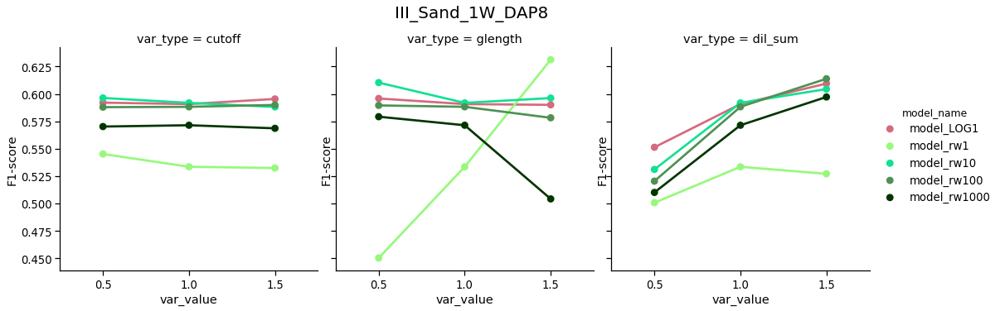

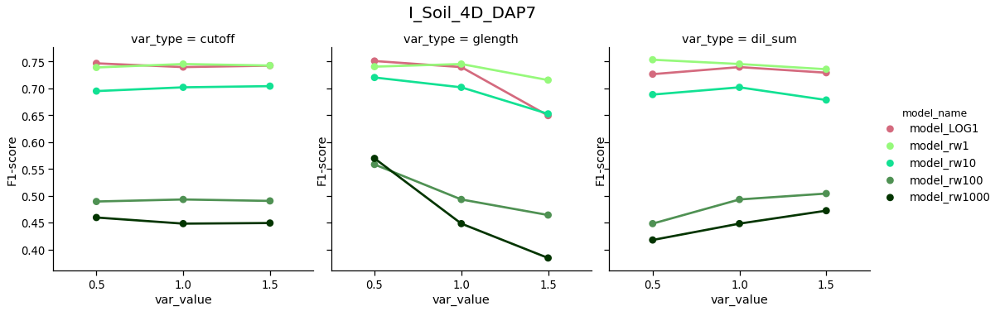

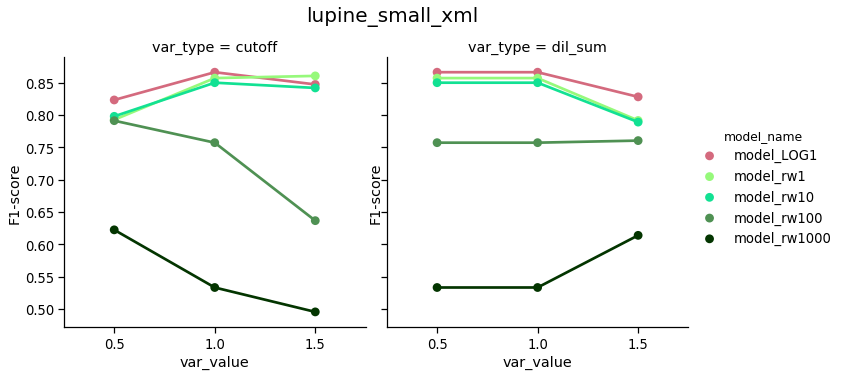

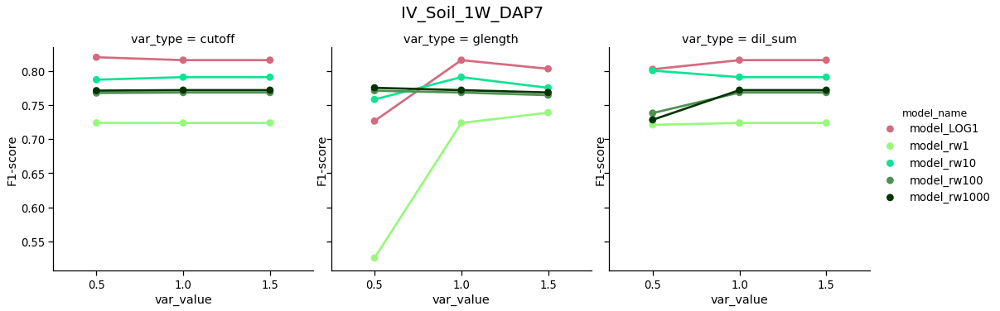

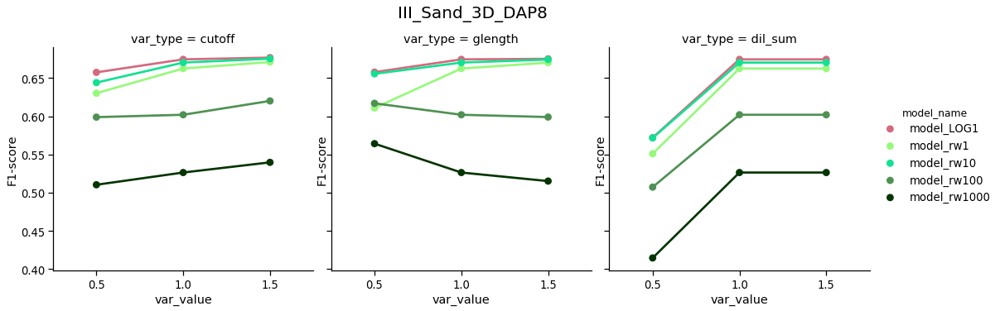

...

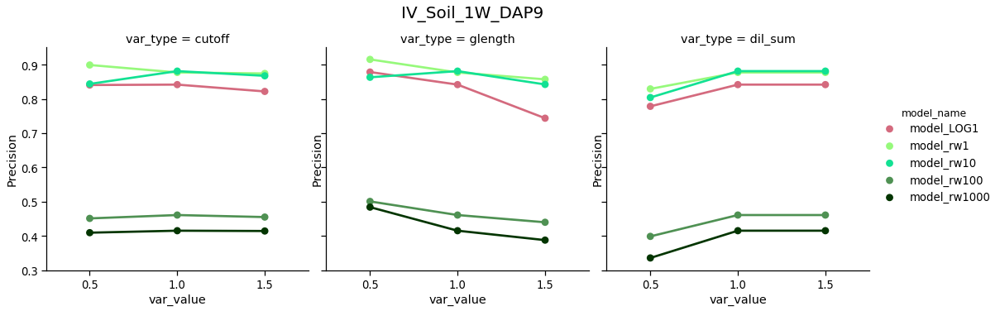

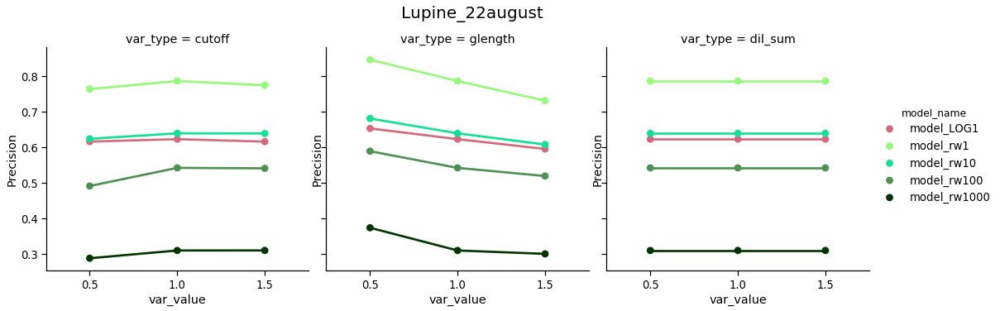

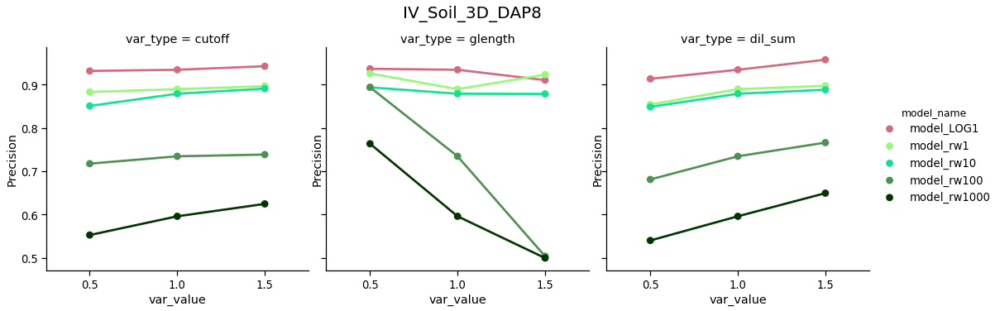

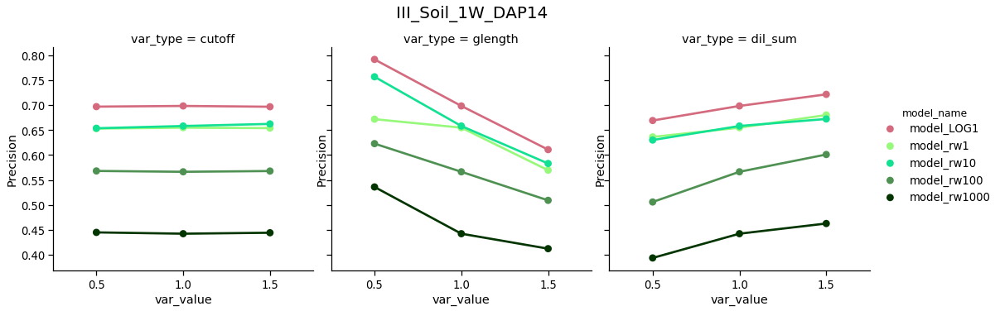

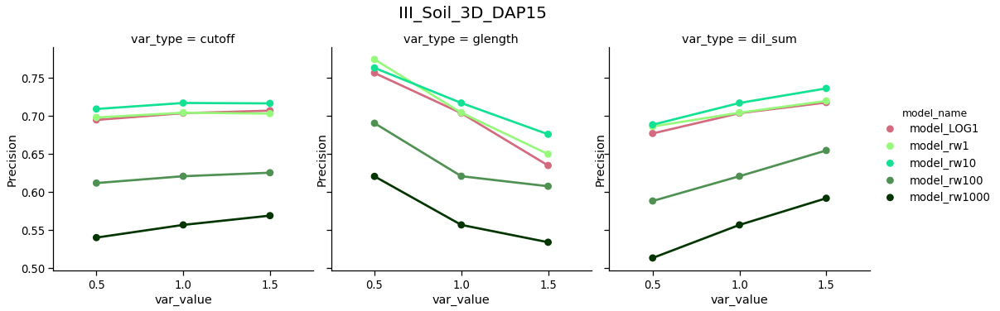

In [270]:
distance_tolerance = 9
sns.set_context("notebook", font_scale=1.2)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

for metric_type in METRICS:  # 'f1', 'pre','rec'
    for dn in df.data_name.unique():
        # if dn == 'lupine_small_xml':  # lupine_small_xml is a special case with only 0 glength
        # print(dn)
        df2 = df.loc[(df['data_name']==dn) & (df['dst']==distance_tolerance)]

        length_new = len(df2.index)
        new_df_data = {'var_type':['' for _ in range(length_new)], 
                       'var_value':np.zeros(length_new), 
                       'model_name':['' for _ in range(length_new)],
                       metric_type:np.zeros(length_new)}
        new_df = pd.DataFrame.from_dict(new_df_data)

        if dn != 'lupine_small_xml':
            variable_params = ['cutoff', 'dil_sum', 'glength']
        else:
            variable_params = ['cutoff', 'dil_sum']
        for p in variable_params:
            new_df.loc[(df2[p]!=1).tolist(), 'var_type'] = p
            new_df.loc[(df2[p]!=1).tolist(), 'var_value'] = df2.loc[(df2[p]!=1).tolist(), p].tolist()
            new_df.loc[(df2[p]!=1).tolist(), metric_type] = df2.loc[(df2[p]!=1).tolist(), metric_type].tolist()
            new_df.loc[(df2[p]!=1).tolist(), 'model_name'] = df2.loc[(df2[p]!=1).tolist(), 'model_name'].tolist()

        base_rows = (df2[variable_params[0]]==1)
        for i in range(1,len(variable_params)):
            base_rows = base_rows & (df2[variable_params[i]]==1)
        base_rows = base_rows.tolist()

        # set the row where all the params are 1
        new_df.loc[base_rows, 'var_type'] = variable_params[0]
        new_df.loc[base_rows, 'var_value'] = 1
        new_df.loc[base_rows, metric_type] = df2.loc[base_rows, metric_type].tolist()
        new_df.loc[base_rows, 'model_name'] = df2.loc[base_rows, 'model_name'].tolist()

        for mn in df2.model_name.unique():
            # append more rows where all the params are 1, but change the var_types to other params
            current_row = df2.loc[base_rows & (df2['model_name']==mn)]
            for i in range(1,len(variable_params)):
                new_df = new_df.append({'var_type':variable_params[i], 'var_value':1, 
                               'model_name':mn, metric_type:current_row[metric_type].iloc[0]}, ignore_index=True)
        ax = sns.catplot(data=new_df, x='var_value', y=metric_type, hue='model_name', col='var_type', kind='point')
        fig = ax.fig
        fig.suptitle(dn, y=1.05, x=0.48, fontsize=20)
        if metric_type == 'f1':
            ax.set(ylabel='F1-score')
        elif metric_type == 'pre':  # the precision and recall values are exchanged in the xml file
            ax.set(ylabel='Recall')
        elif metric_type == 'rec':
            ax.set(ylabel='Precision')


#         subdir_to_save = join(figure_save_dir, 'plots_for_individual_data', dn)
#         os.makedirs(subdir_to_save, exist_ok=True)
#         ax.savefig(join(subdir_to_save, '{}_against_paramValues_dst9.png').format(metric_type))

        plt.show()
        plt.close()


# new_df

In [590]:
df

,data name,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,LOG1,1.0,1.0,1.0,1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,LOG1,1.0,1.0,1.0,1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,LOG1,1.0,1.0,1.0,1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,LOG1,1.0,1.0,1.0,1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,LOG1,1.0,1.0,1.0,1.0,0.6845,0.7559,0.6255
5,III_Sand_1W_DAP8,15,LOG1,1.0,1.0,1.0,1.0,0.7049,0.7784,0.6441
6,III_Sand_1W_DAP8,5,LOG1,0.5,1.0,1.0,1.0,0.4343,0.4794,0.3969
7,III_Sand_1W_DAP8,7,LOG1,0.5,1.0,1.0,1.0,0.5198,0.5738,0.4751
8,III_Sand_1W_DAP8,9,LOG1,0.5,1.0,1.0,1.0,0.5920,0.6535,0.5411
9,III_Sand_1W_DAP8,11,LOG1,0.5,1.0,1.0,1.0,0.6435,0.7104,0.5882


### Compare models

In [639]:
def prepare_dataframe(df, list_other_param_values, variable_params=['cutoff', 'dilation multiplier', 'gap length']):
    # columns in the output new_df: model_name, precision (average), recall (average), distance_tolerance
    
    # list_other_param_values = [0.5, 1.5]
    num_param_combinations = 1 + len(list_other_param_values)*len(variable_params) 
    num_rows_new_df = len(df['model name'].unique()) * len(df['distance tolerance'].unique()) * num_param_combinations
    
    # different combinations of the param values
    combination_params = [[1 for _ in range(len(variable_params))]]
    for i_p in range(len(variable_params)):
        for i_v in list_other_param_values:
            _params = [1 for _ in range(len(variable_params))]
            _params[i_p] = i_v
            combination_params.append(_params)
    print(combination_params)
    
    # initialize the new df
    new_df_data = {'model name':['' for _ in range(num_rows_new_df)],
                   'distance tolerance':np.zeros(num_rows_new_df),
                   'pre':np.zeros(num_rows_new_df),
                   'rec':np.zeros(num_rows_new_df)}
    
    # fill the values in new_df
    row_i = 0
    for mn in df['model name'].unique():
        for d in df['distance tolerance'].unique():            
            for _params in combination_params:  
                temp_df = df.loc[(df['model name']==mn) & (df['distance tolerance']==d)]
                for i in range(len(_params)):
                    _p = _params[i]  # value of param
                    _p_name = variable_params[i]
                    temp_df = temp_df.loc[temp_df[_p_name]==_p]

#                 # UPDATE: now the params with only one value are replaced with 1 so the following process is not needed anymore
#                 # for the special data 'lupine_small_xml', append the data row 
#                 # because for 'lupine_small_xml', parameter 'glength' is always equal to 0
#                 # print('lupine_small_xml in temp_df:', 'lupine_small_xml' in temp_df.data_name.unique())
#                 special_row = df.loc[(df['model name']==mn) 
#                                      & (df['distance tolerance']==d) 
#                                      & (df['data name']=='lupine_small_xml')]
#                 for i in range(len(_params)-1):  # ignore the last param 'glength'
#                     _p = _params[i]  
#                     _p_name = variable_params[i]
#                     special_row = special_row.loc[special_row[_p_name]==_p]
#                 temp_df.append(special_row)
                
#                 # debug
#                 if row_i==0 or row_i==1:
#                     print('temp_df:\n', temp_df)
                
                # add the values to the new_df
                new_df_data['model name'][row_i] = mn
                new_df_data['distance tolerance'][row_i] = d
                new_df_data['pre'][row_i] = temp_df['pre'].mean()
                new_df_data['rec'][row_i] = temp_df['rec'].mean()           
                row_i += 1
                
    new_df = pd.DataFrame.from_dict(new_df_data)
                            
    return new_df

In [61]:
df

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,1.0,1.0,1.0,-1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,model_LOG1,1.0,1.0,1.0,-1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,model_LOG1,1.0,1.0,1.0,-1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,model_LOG1,1.0,1.0,1.0,-1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,model_LOG1,1.0,1.0,1.0,-1.0,0.6845,0.7559,0.6255
...,...,...,...,...,...,...,...,...,...,...
5749,III_Soil_3D_DAP15,7,model_rw1000,1.0,1.5,1.0,-1.0,0.6462,0.7547,0.5649
5750,III_Soil_3D_DAP15,9,model_rw1000,1.0,1.5,1.0,-1.0,0.6765,0.7901,0.5914
5751,III_Soil_3D_DAP15,11,model_rw1000,1.0,1.5,1.0,-1.0,0.6947,0.8113,0.6073
5752,III_Soil_3D_DAP15,13,model_rw1000,1.0,1.5,1.0,-1.0,0.7054,0.8239,0.6167


In [676]:
df_compare_models = prepare_dataframe(df, list_other_param_values=[0.5, 1.5])
df_compare_models

[[1, 1, 1], [0.5, 1, 1], [1.5, 1, 1], [1, 0.5, 1], [1, 1.5, 1], [1, 1, 0.5], [1, 1, 1.5]]


,model name,distance tolerance,pre,rec
0,LOG1,5.0,0.657382,0.657527
1,LOG1,5.0,0.652332,0.652364
2,LOG1,5.0,0.661482,0.660759
3,LOG1,5.0,0.685405,0.630245
4,LOG1,5.0,0.632309,0.670782
5,LOG1,5.0,0.565167,0.677971
6,LOG1,5.0,0.665090,0.620619
7,LOG1,7.0,0.749064,0.746036
8,LOG1,7.0,0.747632,0.744805
9,LOG1,7.0,0.751664,0.746932


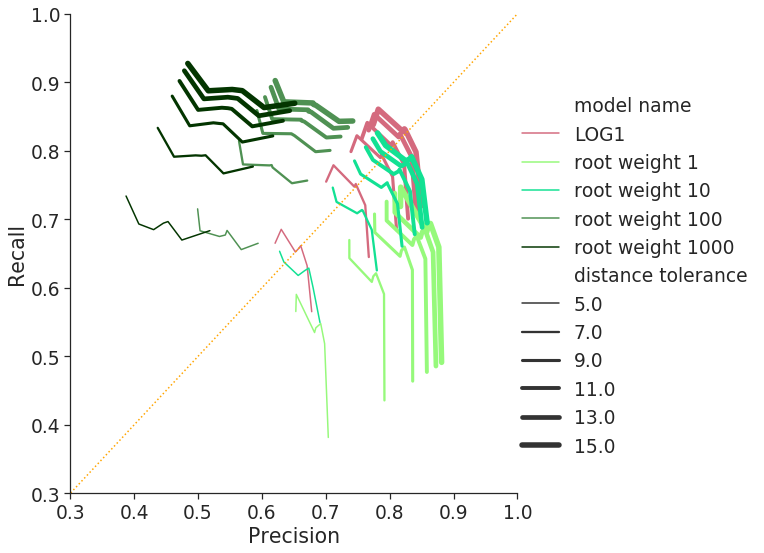

In [677]:
# plot

sns.set_context("notebook", font_scale=1.7)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

# df_compare_models = df_compare_models.rename(columns={"dst": "distance_tolerance"})
ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=df_compare_models, kind='line', 
                     aspect=1, legend='full', height=8, sizes=(1.5,5.5))
ax.set(xlabel='Precision', ylabel='Recall')
plt.xlim(0.3,1)
plt.ylim(0.3,1)
plt.plot((0,1), (0,1), ':', color='orange')

# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_all_dst.png'))


### New eval results of model_rw1

In [700]:
dict_models_xml = {'model_rw1': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw1/glength_1.0-2.0.xml'}
rw1_df = xml_to_df(dict_models_xml)

pd.set_option('display.max_rows', 50)
rw1_df

Processing model: model_rw1


,data name,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
0,III_Sand_1W_DAP8,15,root weight 1,100.0,1.95,10.0,-1.0,0.6190,0.5807,0.6627
2,III_Sand_1W_DAP8,15,root weight 1,100.0,1.95,12.0,-1.0,0.7432,0.7935,0.6989
3,III_Sand_1W_DAP8,15,root weight 1,100.0,1.95,15.0,-1.0,0.7372,0.7879,0.6927
4,III_Sand_1W_DAP8,15,root weight 1,100.0,1.95,18.0,-1.0,0.7344,0.7879,0.6877
5,III_Sand_1W_DAP8,15,root weight 1,100.0,1.95,20.0,-1.0,0.7391,0.7967,0.6893
...,...,...,...,...,...,...,...,...,...,...
161,III_Soil_3D_DAP15,15,root weight 1,450.0,2.00,45.0,-1.0,0.7466,0.7483,0.7448
163,III_Soil_3D_DAP15,15,root weight 1,450.0,2.00,56.0,-1.0,0.7417,0.7498,0.7339
164,III_Soil_3D_DAP15,15,root weight 1,450.0,2.00,68.0,-1.0,0.7210,0.7551,0.6897
165,III_Soil_3D_DAP15,15,root weight 1,450.0,2.00,79.0,-1.0,0.7156,0.7558,0.6795


In [701]:
# show the unique values of a param column for the same data in one model
rw1_df.loc[rw1_df['model name']=='root weight 1'].groupby('data name')['gap length'].unique()

data name
III_Sand_1W_DAP14     [15.0, 19.0, 22.0, 26.0, 30.0]
III_Sand_1W_DAP8      [10.0, 12.0, 15.0, 18.0, 20.0]
III_Sand_3D_DAP14    [50.0, 62.0, 75.0, 88.0, 100.0]
III_Sand_3D_DAP8      [20.0, 25.0, 30.0, 35.0, 40.0]
III_Soil_1W_DAP10     [30.0, 38.0, 45.0, 52.0, 60.0]
III_Soil_1W_DAP14     [45.0, 56.0, 68.0, 79.0, 90.0]
III_Soil_3D_DAP15     [45.0, 56.0, 68.0, 79.0, 90.0]
III_Soil_3D_DAP6      [10.0, 12.0, 15.0, 18.0, 20.0]
II_Soil_4D_DAP5       [15.0, 19.0, 22.0, 26.0, 30.0]
II_soil_2W_DAP5       [25.0, 31.0, 38.0, 44.0, 50.0]
IV_Sand_2W_DAP6       [30.0, 38.0, 45.0, 52.0, 60.0]
IV_Sand_2W_DAP8       [20.0, 25.0, 30.0, 35.0, 40.0]
IV_Sand_3D_DAP8       [35.0, 44.0, 52.0, 61.0, 70.0]
IV_Soil_1W_DAP7       [10.0, 12.0, 15.0, 18.0, 20.0]
IV_Soil_1W_DAP9       [12.0, 15.0, 18.0, 21.0, 24.0]
IV_Soil_3D_DAP6       [14.0, 18.0, 21.0, 24.0, 28.0]
IV_Soil_3D_DAP8          [6.0, 8.0, 9.0, 10.0, 12.0]
I_Sand_3D_DAP5        [30.0, 38.0, 45.0, 52.0, 60.0]
I_Soil_1W_DAP7        [47.0, 59.0, 7

In [702]:
### Normalize the values of extraction parameters             
normalize_df_params_inplace(rw1_df, normalized_values=[1., 1.25, 1.5, 1.75, 2.0])

# remove the rows with the default params (because already in the original df)
rw1_df = remove_default_param_results(rw1_df, ['cutoff','dilation multiplier','gap length'])

There is only 1 value of cutoff for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of dilation multiplier for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of intp for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of cutoff for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of dilation multiplier for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of intp for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of cutoff for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of dilation multiplier for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of intp for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of cutoff for data lupine_small_xml, replacing with value 1.0
There is only 1 value of dilation multiplier for data lupine_small_xml, replacing with value 1.0
There is only 1 value of gap length for

In [705]:
# pd.set_option('display.max_rows', None)
rw1_df_compare_models = prepare_dataframe(rw1_df, list_other_param_values=[1.25, 1.5, 1.75, 2.0], 
                                             variable_params=['gap length']).dropna()
rw1_df_compare_models

[[1], [1.25], [1.5], [1.75], [2.0]]


,model name,distance tolerance,pre,rec
1,root weight 1,15.0,0.726481,0.841143
2,root weight 1,15.0,0.747014,0.819995
3,root weight 1,15.0,0.766810,0.809781
4,root weight 1,15.0,0.773729,0.796019


(0, 1)

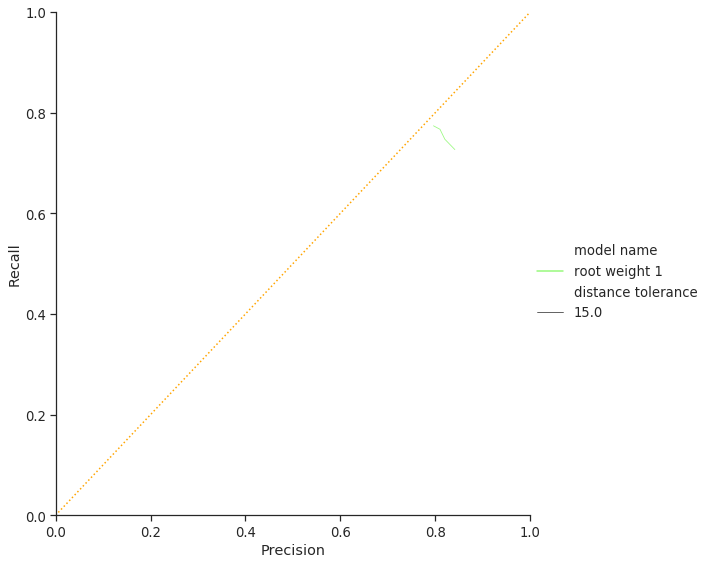

In [706]:
# plot

sns.set_context("notebook", font_scale=1.2)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['light green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=rw1_df_compare_models, kind='line', 
                     aspect=1, legend='full', height=8)

ax.set(xlabel='Precision', ylabel='Recall')
plt.plot((0,1), (0,1), ':', color='orange')
plt.xlim(0,1)
plt.ylim(0,1)

### New eval results of model_rw1000

In [707]:
dict_models_xml = {'model_rw1000': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw1000/glength_0.1-1.0_temp.xml'}
rw1000_df = xml_to_df(dict_models_xml)

pd.set_option('display.max_rows', 50)
rw1000_df

Processing model: model_rw1000


,data name,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,root weight 1000,100.0,1.95,10.0,-1.0,0.4270,0.5191,0.3627
1,III_Sand_1W_DAP8,7,root weight 1000,100.0,1.95,10.0,-1.0,0.5070,0.6163,0.4306
2,III_Sand_1W_DAP8,9,root weight 1000,100.0,1.95,10.0,-1.0,0.5714,0.6946,0.4853
3,III_Sand_1W_DAP8,11,root weight 1000,100.0,1.95,10.0,-1.0,0.6201,0.7539,0.5267
4,III_Sand_1W_DAP8,13,root weight 1000,100.0,1.95,10.0,-1.0,0.6492,0.7893,0.5514
...,...,...,...,...,...,...,...,...,...,...
919,III_Sand_3D_DAP14,7,root weight 1000,200.0,2.00,45.0,-1.0,0.3513,0.7485,0.2295
920,III_Sand_3D_DAP14,9,root weight 1000,200.0,2.00,45.0,-1.0,0.3765,0.8022,0.2460
921,III_Sand_3D_DAP14,11,root weight 1000,200.0,2.00,45.0,-1.0,0.3878,0.8263,0.2534
922,III_Sand_3D_DAP14,13,root weight 1000,200.0,2.00,45.0,-1.0,0.3961,0.8440,0.2588


In [710]:
# show the unique values of a param column for the same data in one model
rw1000_df.loc[rw1000_df['model name']=='root weight 1000'].groupby('data name')['gap length'].unique()

data name
III_Sand_1W_DAP14      [15.0, 2.0, 5.0, 8.0, 11.0, 14.0]
III_Sand_1W_DAP8         [10.0, 1.0, 3.0, 5.0, 7.0, 9.0]
III_Sand_3D_DAP14    [50.0, 5.0, 15.0, 25.0, 35.0, 45.0]
III_Sand_3D_DAP8      [20.0, 2.0, 6.0, 10.0, 14.0, 18.0]
III_Soil_1W_DAP10     [30.0, 3.0, 9.0, 15.0, 21.0, 27.0]
III_Soil_3D_DAP6         [10.0, 1.0, 3.0, 5.0, 7.0, 9.0]
II_Soil_4D_DAP5        [15.0, 2.0, 5.0, 8.0, 11.0, 14.0]
II_soil_2W_DAP5       [25.0, 2.0, 8.0, 13.0, 18.0, 23.0]
IV_Sand_2W_DAP6       [30.0, 3.0, 9.0, 15.0, 21.0, 27.0]
IV_Sand_2W_DAP8       [20.0, 2.0, 6.0, 10.0, 14.0, 18.0]
IV_Sand_3D_DAP8      [35.0, 4.0, 11.0, 18.0, 25.0, 32.0]
IV_Soil_1W_DAP7          [10.0, 1.0, 3.0, 5.0, 7.0, 9.0]
IV_Soil_1W_DAP9         [12.0, 1.0, 4.0, 6.0, 8.0, 11.0]
IV_Soil_3D_DAP6        [14.0, 1.0, 4.0, 7.0, 10.0, 13.0]
IV_Soil_3D_DAP8           [6.0, 1.0, 2.0, 3.0, 4.0, 5.0]
I_Sand_3D_DAP5        [30.0, 3.0, 9.0, 15.0, 21.0, 27.0]
I_Soil_1W_DAP7       [47.0, 5.0, 14.0, 24.0, 33.0, 42.0]
I_Soil_4D_DAP7       

In [711]:
### Normalize the values of extraction parameters             
normalize_df_params_inplace(rw1000_df, normalized_values=[0.1, 0.3, 0.5, 0.7, 0.9, 1])

# remove the rows with the default params (because already in the original df)
rw1000_df = remove_default_param_results(rw1000_df, ['cutoff','dilation multiplier','gap length'])

There is only 1 value of cutoff for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of dilation multiplier for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of intp for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of cutoff for data III_Sand_3D_DAP8, replacing with value 1.0
There is only 1 value of dilation multiplier for data III_Sand_3D_DAP8, replacing with value 1.0
There is only 1 value of intp for data III_Sand_3D_DAP8, replacing with value 1.0
There is only 1 value of cutoff for data IV_Soil_3D_DAP6, replacing with value 1.0
There is only 1 value of dilation multiplier for data IV_Soil_3D_DAP6, replacing with value 1.0
There is only 1 value of intp for data IV_Soil_3D_DAP6, replacing with value 1.0
There is only 1 value of cutoff for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of dilation multiplier for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of intp for dat

In [713]:
# pd.set_option('display.max_rows', None)
rw1000_df_compare_models = prepare_dataframe(rw1000_df, list_other_param_values=[0.1, 0.3, 0.5, 0.7, 0.9], 
                                             variable_params=['gap length']).dropna()
rw1000_df_compare_models

[[1], [0.1], [0.3], [0.5], [0.7], [0.9]]


,model name,distance tolerance,pre,rec
1,root weight 1000,5.0,0.633544,0.580567
2,root weight 1000,5.0,0.669533,0.559956
3,root weight 1000,5.0,0.677922,0.534389
4,root weight 1000,5.0,0.684344,0.506494
5,root weight 1000,5.0,0.684650,0.483211
7,root weight 1000,7.0,0.718389,0.654728
8,root weight 1000,7.0,0.761189,0.632211
9,root weight 1000,7.0,0.770367,0.603067
10,root weight 1000,7.0,0.777906,0.571611
11,root weight 1000,7.0,0.780167,0.546878


(0, 1)

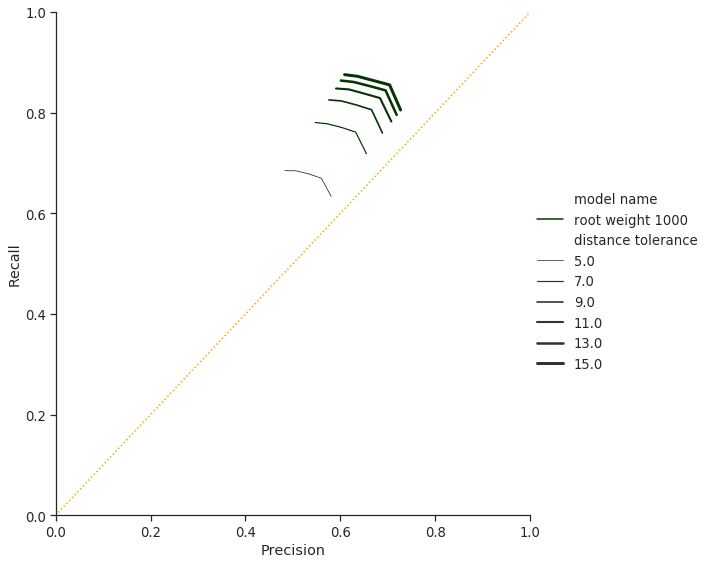

In [714]:
# plot

sns.set_context("notebook", font_scale=1.2)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=rw1000_df_compare_models, kind='line', 
                     aspect=1, legend='full', height=8)

ax.set(xlabel='Precision', ylabel='Recall')
plt.plot((0,1), (0,1), ':', color='orange')
plt.xlim(0,1)
plt.ylim(0,1)

### New eval results of model_rw100

In [715]:

dict_models_xml = {'model_rw100': '/home/user/zhaoy/root_mri/data/new_MRI_images/downloaded_from_Pydio/20200205_whole/converted_npy/segmentation_output/model_rw100/dl_range_1.75-2.5.xml'}
rw100_df = xml_to_df(dict_models_xml)

pd.set_option('display.max_rows', 50)
rw100_df

Processing model: model_rw100


,data name,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
0,III_Sand_1W_DAP8,15,root weight 100,100.0,1.95,10.0,-1.0,0.6925,0.7836,0.6204
1,III_Sand_1W_DAP8,15,root weight 100,100.0,3.41,10.0,-1.0,0.7667,0.7541,0.7798
2,III_Sand_1W_DAP8,15,root weight 100,100.0,3.90,10.0,-1.0,0.7667,0.7541,0.7798
3,III_Sand_1W_DAP8,15,root weight 100,100.0,4.88,10.0,-1.0,0.7229,0.6556,0.8055
4,I_Soil_4D_DAP7,15,root weight 100,80.0,2.00,15.0,-1.0,0.5452,0.8531,0.4006
...,...,...,...,...,...,...,...,...,...,...
83,III_Soil_1W_DAP14,15,root weight 100,150.0,7.50,45.0,-1.0,0.7019,0.7576,0.6538
84,III_Soil_3D_DAP15,15,root weight 100,450.0,2.00,45.0,-1.0,0.7428,0.8688,0.6486
85,III_Soil_3D_DAP15,15,root weight 100,450.0,3.50,45.0,-1.0,0.7489,0.8288,0.6831
86,III_Soil_3D_DAP15,15,root weight 100,450.0,4.00,45.0,-1.0,0.7488,0.7925,0.7096


In [716]:
# show the unique values of a param column for the same data in one model
rw100_df.loc[rw100_df['model name']=='root weight 100'].groupby('data name')['dilation multiplier'].unique()

data name
III_Sand_1W_DAP14       [2.0, 3.5, 4.0, 5.0]
III_Sand_1W_DAP8     [1.95, 3.41, 3.9, 4.88]
III_Sand_3D_DAP14       [2.0, 3.5, 4.0, 5.0]
III_Sand_3D_DAP8       [1.0, 1.75, 2.0, 2.5]
III_Soil_1W_DAP10      [1.0, 1.75, 2.0, 2.5]
III_Soil_1W_DAP14      [3.0, 5.25, 6.0, 7.5]
III_Soil_3D_DAP15       [2.0, 3.5, 4.0, 5.0]
III_Soil_3D_DAP6        [2.0, 3.5, 4.0, 5.0]
II_Soil_4D_DAP5        [1.0, 1.75, 2.0, 2.5]
II_soil_2W_DAP5        [1.0, 1.75, 2.0, 2.5]
IV_Sand_2W_DAP6         [2.0, 3.5, 4.0, 5.0]
IV_Sand_2W_DAP8         [2.0, 3.5, 4.0, 5.0]
IV_Sand_3D_DAP8       [1.5, 2.62, 3.0, 3.75]
IV_Soil_1W_DAP7      [1.25, 2.19, 2.5, 3.12]
IV_Soil_1W_DAP9      [1.25, 2.19, 2.5, 3.12]
IV_Soil_3D_DAP6       [1.5, 2.62, 3.0, 3.75]
IV_Soil_3D_DAP8         [2.0, 3.5, 4.0, 5.0]
I_Sand_3D_DAP5          [2.0, 3.5, 4.0, 5.0]
I_Soil_1W_DAP7         [1.0, 1.75, 2.0, 2.5]
I_Soil_4D_DAP7          [2.0, 3.5, 4.0, 5.0]
Lupine_22august        [0.2, 0.35, 0.4, 0.5]
lupine_small_xml     [0.95, 1.66, 1.9, 2.38]


In [717]:
### Normalize the values of extraction parameters             
normalize_df_params_inplace(rw100_df, normalized_values=[1.0, 1.75, 2.0, 2.5])

# remove the rows with the default params (because already in the original df)
rw100_df = remove_default_param_results(rw100_df, ['cutoff','dilation multiplier','gap length'])

There is only 1 value of cutoff for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of gap length for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of intp for data III_Sand_1W_DAP8, replacing with value 1.0
There is only 1 value of cutoff for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of gap length for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of intp for data I_Soil_4D_DAP7, replacing with value 1.0
There is only 1 value of cutoff for data lupine_small_xml, replacing with value 1.0
There is only 1 value of gap length for data lupine_small_xml, replacing with value 1.0
There is only 1 value of intp for data lupine_small_xml, replacing with value 1.0
There is only 1 value of cutoff for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of gap length for data IV_Soil_1W_DAP7, replacing with value 1.0
There is only 1 value of intp for data IV_Soil_1W_DAP7, replacing with val

In [719]:
# pd.set_option('display.max_rows', None)
rw100_df_compare_models = prepare_dataframe(rw100_df, list_other_param_values=[1.75, 2.0, 2.5], 
                                             variable_params=['dilation multiplier']).dropna()
rw100_df_compare_models

[[1], [1.75], [2.0], [2.5]]


,model name,distance tolerance,pre,rec
1,root weight 100,15.0,0.837168,0.730795
2,root weight 100,15.0,0.812509,0.749955
3,root weight 100,15.0,0.774500,0.768368


(0, 1)

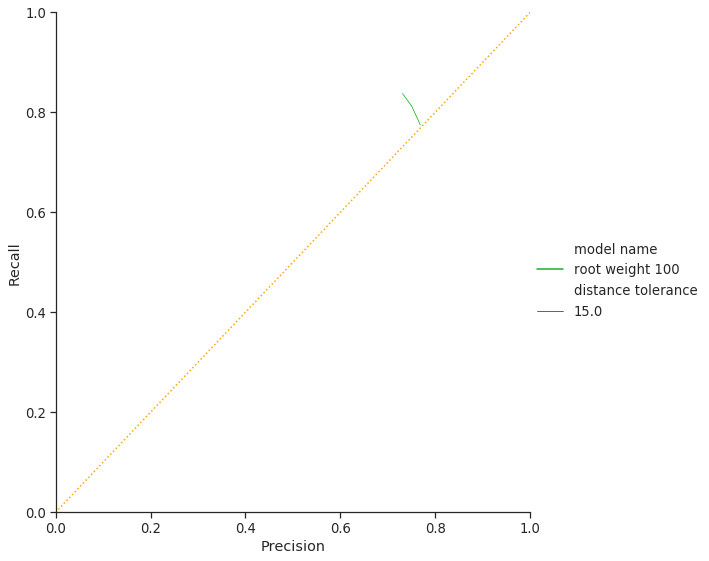

In [720]:
# plot

sns.set_context("notebook", font_scale=1.2)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=rw100_df_compare_models, kind='line', 
                     aspect=1, legend='full', height=8)

ax.set(xlabel='Precision', ylabel='Recall')
plt.plot((0,1), (0,1), ':', color='orange')
plt.xlim(0,1)
plt.ylim(0,1)

### combine the dataframes for plotting

In [721]:
# combine all the needed dataframes
df_compare_models_new = combine_dfs([df_compare_models, rw1_df_compare_models, rw100_df_compare_models, rw1000_df_compare_models])

210
214
217


(0.3, 1.02)

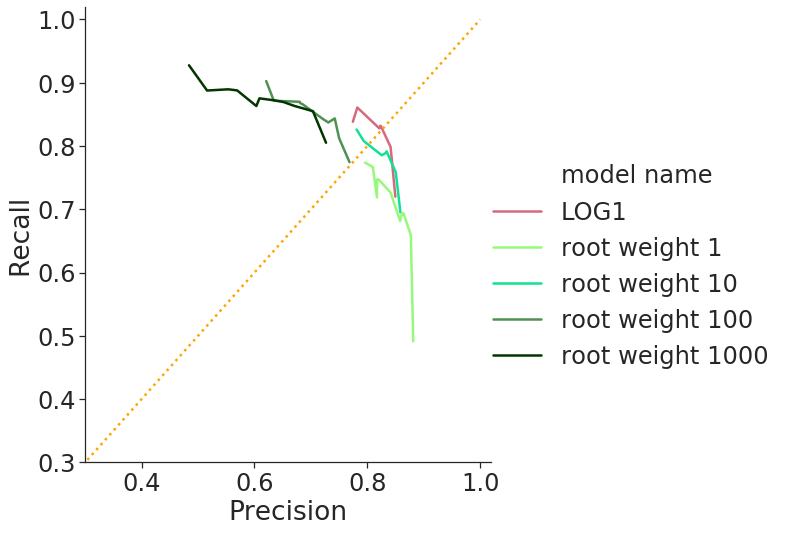

In [771]:

sns.set_context("notebook", font_scale=2.2, rc={"lines.linewidth": 2.5})
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

ax = sns.relplot(x='rec', y='pre', hue='model name', data=df_compare_models_new.loc[df_compare_models_new['distance tolerance']==15], kind='line', 
                     aspect=1, legend='full', height=8)

ax.set(xlabel='Precision', ylabel='Recall')
plt.plot((0,1), (0,1), ':', color='orange')
plt.xlim(0.3,1.02)
plt.ylim(0.3,1.02)
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_dst15_plusNewEval.png'))


In [788]:
def prepare_dataframe2(df, mode='basic'):  # one point is for one data name (with the base parameterization)
    # columns in the output new_df: model_name, precision (average), recall (average), distance_tolerance
    variable_params=['cutoff', 'dilation multiplier', 'gap length']
    assert mode in ['basic', 'average_among_params', 'best_param']
#     num_data = len(df.data_name.unique())
#     num_rows_new_df = len(df.model_name.unique()) * len(df.dst.unique()) * num_data
    
#     # different combinations of the param values
#     combination_params = [[1, 1, 1]]
#     for i_p in range(len(variable_params)):
#         for i_v in [0.5, 1.5]:
#             _params = [1, 1, 1]
#             _params[i_p] = i_v
#             combination_params.append(_params)
#     print(combination_params)
    
    # initialize the new df
    new_df_data = {'model name':[],
                   'distance tolerance':[],
                   'pre':[],
                   'rec':[]}
    
    # fill the values in new_df
    row_i = 0
    for mn in df['model name'].unique():
        for d in df['distance tolerance'].unique():    
            temp_df = df.loc[(df['model name']==mn) & (df['distance tolerance']==d)]
            if mode == 'basic':
                # only choose the base parameterization
                for i in range(len(variable_params)):
                    _p_name = variable_params[i]
                    temp_df = temp_df.loc[temp_df[_p_name]==1]
            elif mode == 'average_among_params':
                # group by the data name and take the average metrics of all possible param combinations
                temp_df = temp_df.groupby('data name').mean()  # take the mean 
            else:
                # group by the data name and take the best metrics of all possible param combinations
                indices_best_f1 = temp_df.groupby('data name')['f1'].idxmax()
                print('indices_best_f1:', indices_best_f1)
                temp_df = temp_df.loc[indices_best_f1]
                
            
#             # UPDATE: now the params with only one value are replaced with 1 so the following process is not needed anymore
#             # for the special data 'lupine_small_xml', append the data row 
#             # because for 'lupine_small_xml', parameter 'glength' is always equal to 0
#             print('lupine_small_xml in temp_df:', 'lupine_small_xml' in temp_df['data name'].unique())
#             special_row = df.loc[(df['model name']==mn) 
#                                  & (df['distance tolerance']==d) 
#                                  & (df['data name']=='lupine_small_xml')]
#             for i in range(len(variable_params)-1):  # ignore the last param 'glength'
#                 _p_name = variable_params[i]
#                 special_row = special_row.loc[special_row[_p_name]==1]
#             temp_df.append(special_row)
            
                
            # debug
            if row_i==0 or row_i==1:
                print('temp_df:\n', temp_df)

            # add the values to the new_df
            num_new_lines = len(temp_df.index)
            new_df_data['model name'].extend([mn for _ in range(num_new_lines)])
            new_df_data['distance tolerance'].extend([d for _ in range(num_new_lines)])
            new_df_data['pre'].extend(temp_df['pre'].tolist())
            new_df_data['rec'].extend(temp_df['rec'].tolist())    
            row_i += 1
                
    new_df = pd.DataFrame.from_dict(new_df_data)
                            
    return new_df

In [787]:
temp_df.loc[569]

data name              III_Sand_3D_DAP14
distance tolerance                    15
model name                          LOG1
cutoff                                 1
dilation multiplier                  0.5
gap length                             1
intp                                   1
f1                                0.7312
pre                               0.8456
rec                               0.6441
Name: 569, dtype: object

In [780]:
ddd=combine_dfs([df, rw1_df, rw100_df, rw1000_df])
temp_df = ddd.loc[(ddd['model name']=='LOG1') & (ddd['distance tolerance']==15)]
temp_df.groupby('data name').idxmax()
# ddd.iloc[38]

4560
4644
4710


,distance tolerance,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
data name,,,,,,,,
III_Sand_1W_DAP14,329,341,365,353,329,353,359,365
III_Sand_1W_DAP8,5,17,41,29,5,41,35,41
III_Sand_3D_DAP14,539,551,575,563,539,539,569,575
III_Sand_3D_DAP8,161,173,197,185,161,173,191,179
III_Soil_1W_DAP10,497,509,533,521,497,509,521,509
III_Soil_1W_DAP14,833,845,869,857,833,869,857,851
III_Soil_3D_DAP15,875,887,911,899,875,887,905,893
III_Soil_3D_DAP6,623,635,659,647,623,647,647,659
II_Soil_4D_DAP5,287,299,323,311,287,299,317,305


In [781]:
temp_df.groupby('data name').max()


,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
data name,,,,,,,,,
III_Sand_1W_DAP14,15,LOG1,1.5,1.5,1.5,1.0,0.8136,0.7504,0.9419
III_Sand_1W_DAP8,15,LOG1,1.5,1.5,1.5,1.0,0.7154,0.7971,0.6952
III_Sand_3D_DAP14,15,LOG1,1.5,1.5,1.5,1.0,0.7333,0.8456,0.6752
III_Sand_3D_DAP8,15,LOG1,1.5,1.5,1.5,1.0,0.7324,0.8994,0.6451
III_Soil_1W_DAP10,15,LOG1,1.5,1.5,1.5,1.0,0.8742,0.8908,0.8897
III_Soil_1W_DAP14,15,LOG1,1.5,1.5,1.5,1.0,0.7846,0.8896,0.8201
III_Soil_3D_DAP15,15,LOG1,1.5,1.5,1.5,1.0,0.7765,0.8253,0.7962
III_Soil_3D_DAP6,15,LOG1,1.5,1.5,1.5,1.0,0.9198,0.8820,0.9819
II_Soil_4D_DAP5,15,LOG1,1.5,1.5,1.5,1.0,0.9059,0.9397,0.9548


In [760]:
df_compare_models2 = prepare_dataframe2(combine_dfs([df, rw1_df, rw100_df, rw1000_df]), mode='average_among_params')

df_compare_models2

4560
4644
4710
temp_df:
                    distance tolerance  cutoff  dilation multiplier  \
data name                                                            
III_Sand_1W_DAP14                   5     1.0                  1.0   
III_Sand_1W_DAP8                    5     1.0                  1.0   
III_Sand_3D_DAP14                   5     1.0                  1.0   
III_Sand_3D_DAP8                    5     1.0                  1.0   
III_Soil_1W_DAP10                   5     1.0                  1.0   
III_Soil_1W_DAP14                   5     1.0                  1.0   
III_Soil_3D_DAP15                   5     1.0                  1.0   
III_Soil_3D_DAP6                    5     1.0                  1.0   
II_Soil_4D_DAP5                     5     1.0                  1.0   
II_soil_2W_DAP5                     5     1.0                  1.0   
IV_Sand_2W_DAP6                     5     1.0                  1.0   
IV_Sand_2W_DAP8                     5     1.0                  1.

,model name,distance tolerance,pre,rec
0,LOG1,5,0.541929,0.708171
1,LOG1,5,0.483386,0.399014
2,LOG1,5,0.584386,0.478814
3,LOG1,5,0.393443,0.282114
4,LOG1,5,0.705057,0.714457
...,...,...,...,...
655,root weight 1000,15,0.856242,0.701000
656,root weight 1000,15,0.910692,0.641217
657,root weight 1000,15,0.831133,0.415825
658,root weight 1000,15,0.949014,0.333843


In [789]:
df_compare_models2 = prepare_dataframe2(combine_dfs([df, rw1_df, rw100_df, rw1000_df]), mode='best_param')

df_compare_models2

4560
4644
4710
indices_best_f1: data name
III_Sand_1W_DAP14    348
III_Sand_1W_DAP8      12
III_Sand_3D_DAP14    564
III_Sand_3D_DAP8     180
III_Soil_1W_DAP10    504
III_Soil_1W_DAP14    864
III_Soil_3D_DAP15    882
III_Soil_3D_DAP6     642
II_Soil_4D_DAP5      294
II_soil_2W_DAP5      462
IV_Sand_2W_DAP6      606
IV_Sand_2W_DAP8      228
IV_Sand_3D_DAP8      672
IV_Soil_1W_DAP7      120
IV_Soil_1W_DAP9      702
IV_Soil_3D_DAP6      252
IV_Soil_3D_DAP8      798
I_Sand_3D_DAP5       366
I_Soil_1W_DAP7       426
I_Soil_4D_DAP7        72
Lupine_22august      744
lupine_small_xml      84
Name: f1, dtype: int64
temp_df:
              data name  distance tolerance model name  cutoff  \
348  III_Sand_1W_DAP14                   5       LOG1     1.0   
12    III_Sand_1W_DAP8                   5       LOG1     1.5   
564  III_Sand_3D_DAP14                   5       LOG1     1.0   
180   III_Sand_3D_DAP8                   5       LOG1     1.0   
504  III_Soil_1W_DAP10                   5       L

,model name,distance tolerance,pre,rec
0,LOG1,5,0.5779,0.7104
1,LOG1,5,0.4852,0.4049
2,LOG1,5,0.6247,0.4758
3,LOG1,5,0.4088,0.3002
4,LOG1,5,0.7148,0.7403
...,...,...,...,...
655,root weight 1000,15,0.8396,0.7963
656,root weight 1000,15,0.8290,0.8757
657,root weight 1000,15,0.8185,0.5788
658,root weight 1000,15,0.9417,0.3958


In [757]:
df_compare_models2 = prepare_dataframe2(combine_dfs([df, rw1_df, rw100_df, rw1000_df]))

df_compare_models2

4560
4644
4710
temp_df:
              data name  distance tolerance model name  cutoff  \
0     III_Sand_1W_DAP8                   5       LOG1     1.0   
42      I_Soil_4D_DAP7                   5       LOG1     1.0   
84    lupine_small_xml                   5       LOG1     1.0   
114    IV_Soil_1W_DAP7                   5       LOG1     1.0   
156   III_Sand_3D_DAP8                   5       LOG1     1.0   
198    IV_Sand_2W_DAP8                   5       LOG1     1.0   
240    IV_Soil_3D_DAP6                   5       LOG1     1.0   
282    II_Soil_4D_DAP5                   5       LOG1     1.0   
324  III_Sand_1W_DAP14                   5       LOG1     1.0   
366     I_Sand_3D_DAP5                   5       LOG1     1.0   
408     I_Soil_1W_DAP7                   5       LOG1     1.0   
450    II_soil_2W_DAP5                   5       LOG1     1.0   
492  III_Soil_1W_DAP10                   5       LOG1     1.0   
534  III_Sand_3D_DAP14                   5       LOG1     1.0   


,model name,distance tolerance,pre,rec
0,LOG1,5,0.4817,0.3986
1,LOG1,5,0.4623,0.5177
2,LOG1,5,0.6919,0.6050
3,LOG1,5,0.7209,0.7180
4,LOG1,5,0.3919,0.2968
...,...,...,...,...
655,root weight 1000,15,0.7982,0.6107
656,root weight 1000,15,0.8591,0.2621
657,root weight 1000,15,0.9481,0.3291
658,root weight 1000,15,0.9404,0.4619


<Figure size 1500x1500 with 0 Axes>

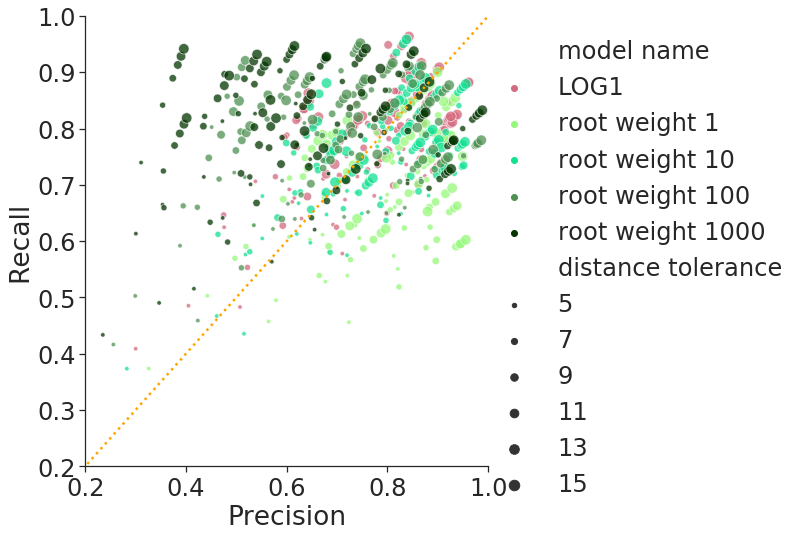

<Figure size 1500x1500 with 0 Axes>

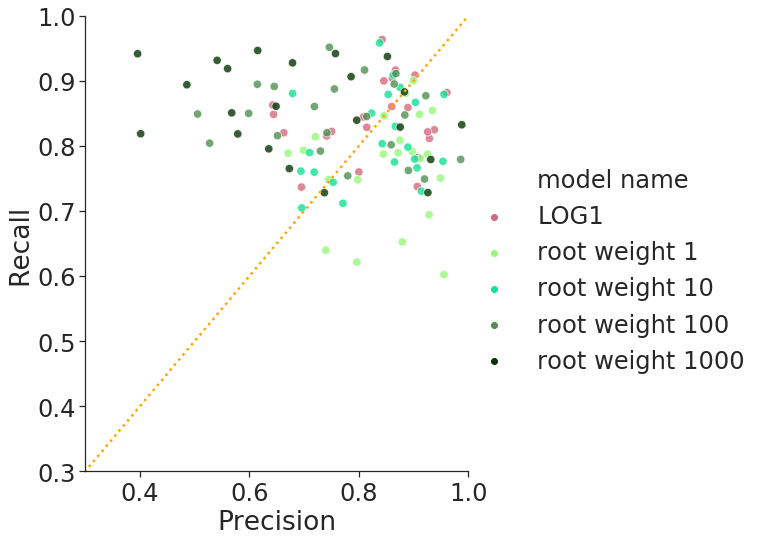

In [792]:
# plot the clustering of points

sns.set_context("notebook", font_scale=2.2, rc={"lines.linewidth": 2.5})
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

# # figure size in inches
# rcParams['figure.figsize'] = 5,5

plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=df_compare_models2, kind='scatter',
                  alpha=0.75, height=8, legend='full', sizes=(20,110))
ax.set(xlabel='Precision', ylabel='Recall')
# plt.legend(loc=[1,0.1]) # adjust legend location
plt.xlim(0.2,1)
plt.ylim(0.2,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_all_dst_perData_defaultParams.png'))


plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', data=df_compare_models2.loc[df_compare_models2['distance tolerance']==15], kind='scatter',
                  alpha=0.8, height=8, legend='full', s=70)

# plt.legend(loc=[1,0.1]) # adjust legend location
ax.set(xlabel='Precision', ylabel='Recall')
plt.xlim(0.3,1)
plt.ylim(0.3,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_dst15_perData_defaultParams.png'))


<Figure size 1500x1500 with 0 Axes>

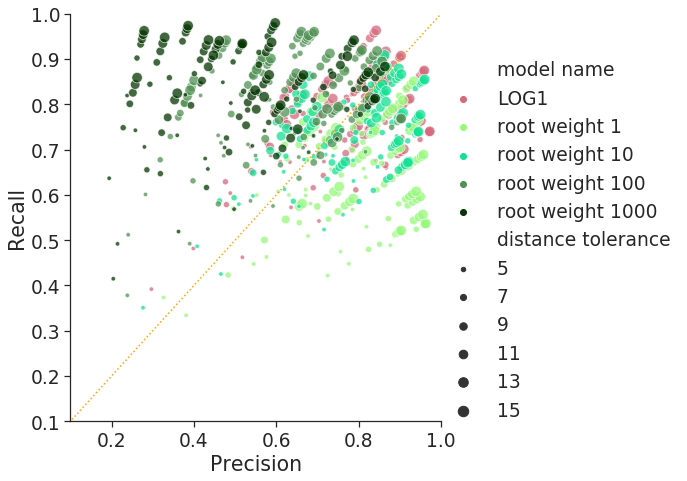

<Figure size 1500x1500 with 0 Axes>

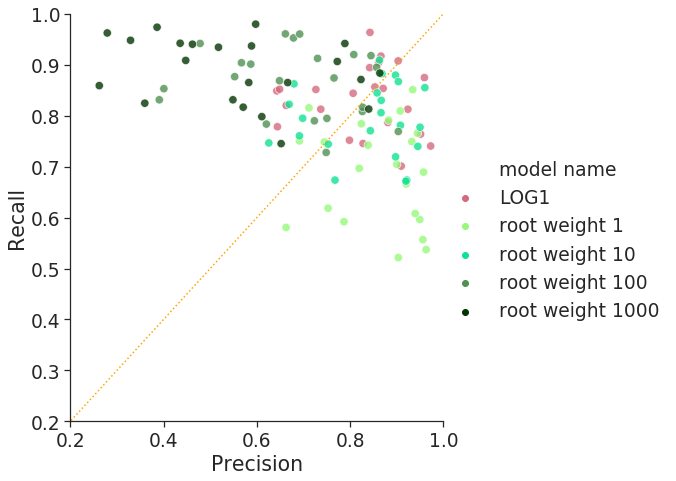

In [758]:
# plot the clustering of points

sns.set_context("notebook", font_scale=1.7)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

# # figure size in inches
# rcParams['figure.figsize'] = 5,5

plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=df_compare_models2, kind='scatter',
                  alpha=0.75, height=8, legend='full', sizes=(20,110))
ax.set(xlabel='Precision', ylabel='Recall')
# plt.legend(loc=[1,0.1]) # adjust legend location
plt.xlim(0.1,1)
plt.ylim(0.1,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_all_dst_perData_defaultParams.png'))


plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', data=df_compare_models2.loc[df_compare_models2['distance tolerance']==15], kind='scatter',
                  alpha=0.8, height=8, legend='full', s=70)

# plt.legend(loc=[1,0.1]) # adjust legend location
ax.set(xlabel='Precision', ylabel='Recall')
plt.xlim(0.2,1)
plt.ylim(0.2,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_dst15_perData_defaultParams.png'))


<Figure size 1500x1500 with 0 Axes>

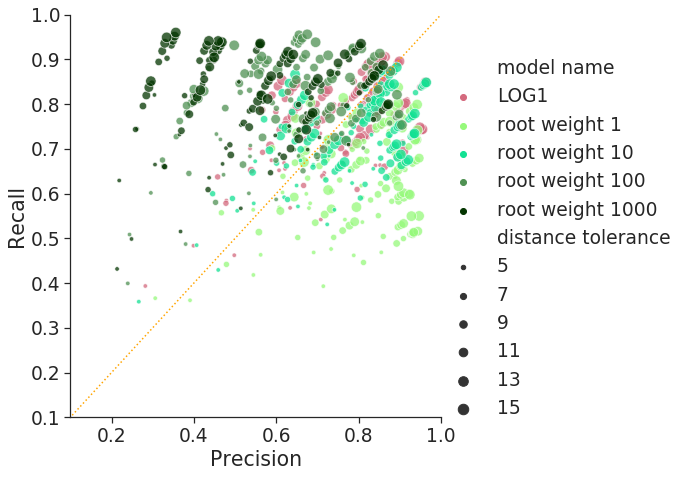

<Figure size 1500x1500 with 0 Axes>

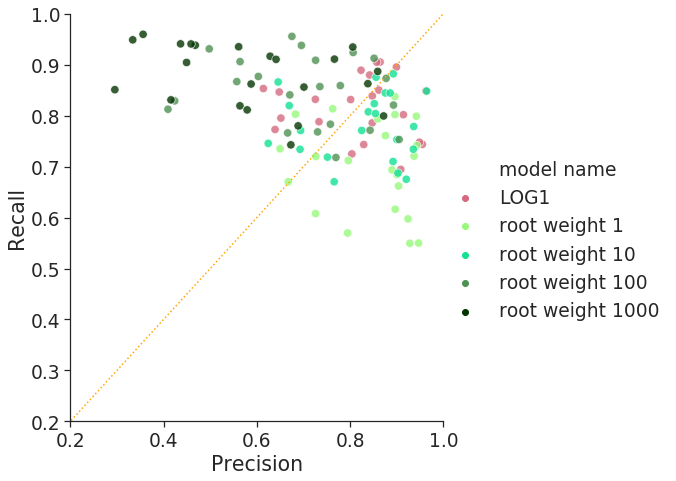

In [756]:
# plot the clustering of points

sns.set_context("notebook", font_scale=1.7)
# colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
# sns.set_palette(sns.color_palette("hls", 8))

# # figure size in inches
# rcParams['figure.figsize'] = 5,5

plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', size='distance tolerance', data=df_compare_models2, kind='scatter',
                  alpha=0.75, height=8, legend='full', sizes=(20,110))
ax.set(xlabel='Precision', ylabel='Recall')
# plt.legend(loc=[1,0.1]) # adjust legend location
plt.xlim(0.1,1)
plt.ylim(0.1,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_all_dst_perData_defaultParams.png'))


plt.figure(dpi=150)
ax = sns.relplot(x='rec', y='pre', hue='model name', data=df_compare_models2.loc[df_compare_models2['distance tolerance']==15], kind='scatter',
                  alpha=0.8, height=8, legend='full', s=70)

# plt.legend(loc=[1,0.1]) # adjust legend location
ax.set(xlabel='Precision', ylabel='Recall')
plt.xlim(0.2,1)
plt.ylim(0.2,1)
plt.plot((0,1), (0,1), ':', color='orange')
# ax.savefig(join(figure_save_dir, 'paper', 'precision_recall_all_models_dst15_perData_defaultParams.png'))


In [ ]:
plt.close()

### Other plots

In [407]:
print(df.loc[df['dst']==15].groupby(['model_name']).mean().loc[:,['f1', 'pre', 'rec']])

                    f1       pre       rec
model_name                                
model_LOG1    0.809510  0.815951  0.816634
model_rw1     0.738254  0.669474  0.853605
model_rw10    0.795218  0.779476  0.825338
model_rw100   0.749641  0.866517  0.680404
model_rw1000  0.667507  0.887842  0.562630


total_num_var 7


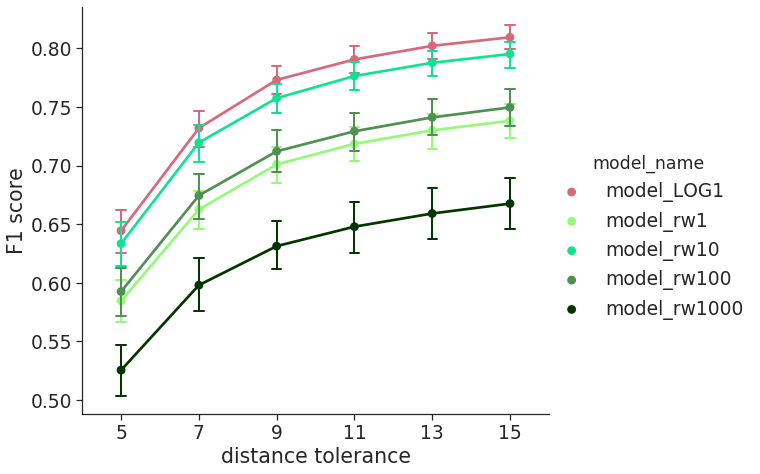

In [411]:
# set plot style
sns.set_context("notebook", font_scale=1.7)
sns.set_style("ticks")
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.2
CAPSIZE = .12
PLOT_TYPE = 'point'  # 'point', 'bar'
ERR_WIDTH = 2
HEIGHT = 7

# the variables
dict_other_var_fix = {}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'dst', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='F1 score')
# ax.savefig(join(figure_save_dir, 'paper', 'f1_against_dst_diff_models_point.png'))

# plt.ylim(0.49,0.84)

total_num_var 7


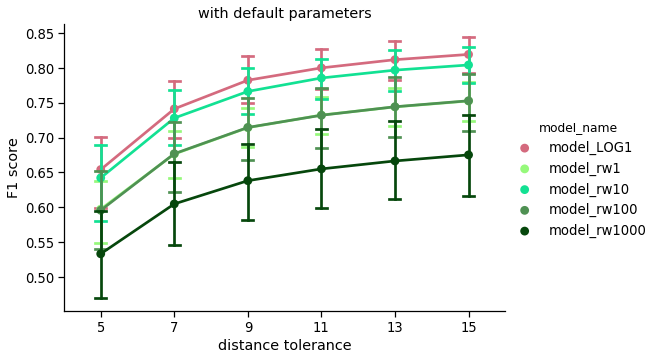

In [143]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'cutoff':1, 'dil_sum':1, 'glength':1, 'intp':-1.00}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# 'cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'dst', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='F1 score', title='with default parameters')
# ax.savefig(join(figure_save_dir, 'f1_against_dst_diff_models.png'))




In [255]:
def get_df_with_conditions(df, var_names, var_values):
    assert len(var_names)==len(var_values)
    new_df = df
    for i in range(len(var_names)):
        var_n = var_names[i]
        var_v = var_values[i]
        new_df = new_df.loc[new_df[var_n]==var_v]
    return new_df


def select_best_params_combination_for_model_data(df, variable_params, metric='f1'):
    mean_metrics = df.groupby(variable_params).mean()[metric]
    max_param_combination = mean_metrics.idxmax()
    selected_df = get_df_with_conditions(df, variable_params, max_param_combination)
    return selected_df


def select_best_params_combinations(df, variable_params, metric='f1'):
    new_df = None
    for mn in df.model_name.unique():
        for dn in df.data_name.unique():
            _df = df.loc[(df['model_name']==mn) & (df['data_name']==dn)]
            selected_df = select_best_params_combination_for_model_data(_df, variable_params, metric)
            if new_df is None:
                new_df = selected_df
            else:
                new_df = new_df.append(selected_df, ignore_index=True)
            
    return new_df
            
    
def normalize_against_model(df, base_model, metric='f1'):
    """
    For each data name with a certain dst value in a non-base_model, 
    divide its metrics by the metrics of the same data name with the same dst value in base_model
    """
    new_df = df.groupby(['data_name', 'dst']).apply(divide_by_base_model, base_model=base_model, metric=metric)
    return new_df


def divide_by_base_model(df, base_model, metric='f1'):
    """
    The input df has only one data_name and dst value. The variables are model_name
    """
    
    # assert len(df.data_name.unique()) == 1
    # assert len(df.dst.unique()) == 1
    assert len(df.index) == 5  # the number of models

    #print(df.columns)
    
    base_metric = df.loc[df['model_name']==base_model, metric].tolist()
    assert len(base_metric) == 1
    base_metric = base_metric[0]
    
    df.loc[:, metric] /= base_metric
    
    
    return df

In [259]:
### generate the F1 to dst plot with only the best param combinations for each data
variable_params=['cutoff', 'dil_sum', 'glength']
df_best_param = select_best_params_combinations(df, variable_params, metric='f1')

df_best_param

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,1.0,1.5,1.0,-1.0,0.4414,0.4546,0.4289
1,III_Sand_1W_DAP8,7,model_LOG1,1.0,1.5,1.0,-1.0,0.5373,0.5534,0.5221
2,III_Sand_1W_DAP8,9,model_LOG1,1.0,1.5,1.0,-1.0,0.6094,0.6276,0.5922
3,III_Sand_1W_DAP8,11,model_LOG1,1.0,1.5,1.0,-1.0,0.6596,0.6793,0.6410
4,III_Sand_1W_DAP8,13,model_LOG1,1.0,1.5,1.0,-1.0,0.6980,0.7189,0.6783
5,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.5,1.0,-1.0,0.7154,0.7368,0.6952
6,I_Soil_4D_DAP7,5,model_LOG1,1.0,1.0,0.5,-1.0,0.4842,0.4506,0.5232
7,I_Soil_4D_DAP7,7,model_LOG1,1.0,1.0,0.5,-1.0,0.6548,0.6094,0.7075
8,I_Soil_4D_DAP7,9,model_LOG1,1.0,1.0,0.5,-1.0,0.7509,0.6988,0.8113
9,I_Soil_4D_DAP7,11,model_LOG1,1.0,1.0,0.5,-1.0,0.8007,0.7452,0.8651


total_num_var 7


(0.5, 0.87)

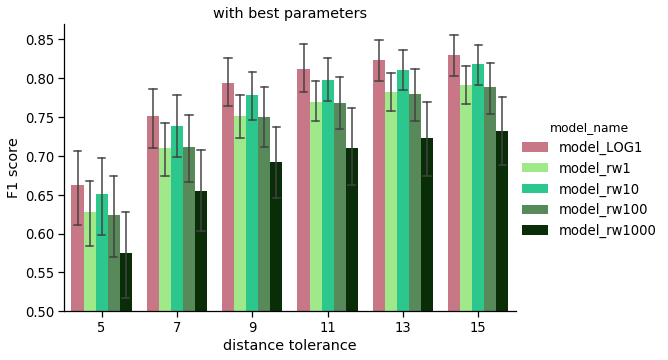

In [285]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .1
PLOT_TYPE = 'bar'  # 'point', 'bar'
ERR_WIDTH = 1.5

# the variables
dict_other_var_fix = {}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df_best_param, 'dst', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='F1 score', title='with best parameters')
# ax.savefig(join(figure_save_dir, 'f1_against_dst_diff_models.png'))
plt.ylim(0.5,0.87)


In [262]:
### Normalize df_best_param and plot

# pd.set_option('display.max_rows', None)
df_best_param_normalized = normalize_against_model(df_best_param, 'model_rw1', metric='f1')
df_best_param_normalized

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,1.0,1.5,1.0,-1.0,0.937553,0.4546,0.4289
1,III_Sand_1W_DAP8,7,model_LOG1,1.0,1.5,1.0,-1.0,0.972489,0.5534,0.5221
2,III_Sand_1W_DAP8,9,model_LOG1,1.0,1.5,1.0,-1.0,0.965463,0.6276,0.5922
3,III_Sand_1W_DAP8,11,model_LOG1,1.0,1.5,1.0,-1.0,0.966164,0.6793,0.6410
4,III_Sand_1W_DAP8,13,model_LOG1,1.0,1.5,1.0,-1.0,0.965555,0.7189,0.6783
5,III_Sand_1W_DAP8,15,model_LOG1,1.0,1.5,1.0,-1.0,0.970429,0.7368,0.6952
6,I_Soil_4D_DAP7,5,model_LOG1,1.0,1.0,0.5,-1.0,0.907421,0.4506,0.5232
7,I_Soil_4D_DAP7,7,model_LOG1,1.0,1.0,0.5,-1.0,0.965782,0.6094,0.7075
8,I_Soil_4D_DAP7,9,model_LOG1,1.0,1.0,0.5,-1.0,0.996814,0.6988,0.8113
9,I_Soil_4D_DAP7,11,model_LOG1,1.0,1.0,0.5,-1.0,1.005147,0.7452,0.8651


total_num_var 7


(0.6, 1.1)

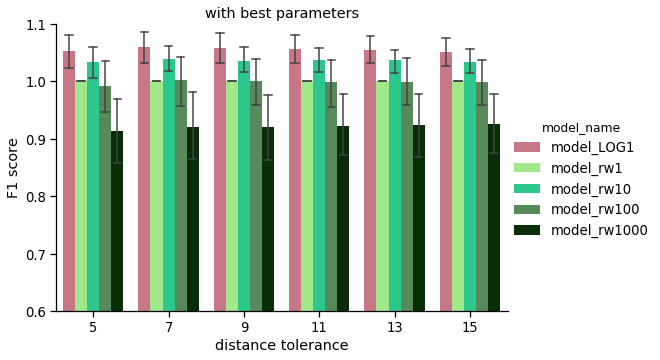

In [280]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .1
PLOT_TYPE = 'bar'  # 'point', 'bar'
ERR_WIDTH = 1.5


# the variables
dict_other_var_fix = {}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df_best_param_normalized, 'dst', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='F1 score', title='with best parameters')
plt.ylim(0.6,1.1)
# ax.savefig(join(figure_save_dir, 'f1_against_dst_diff_models.png'))


total_num_var 7


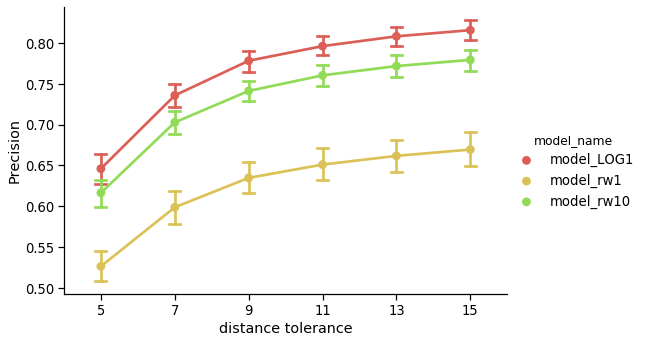

In [49]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'dst', 'pre', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='Precision')
# ax.savefig(join(figure_save_dir, 'pre_against_dst_diff_models.png'))

total_num_var 7


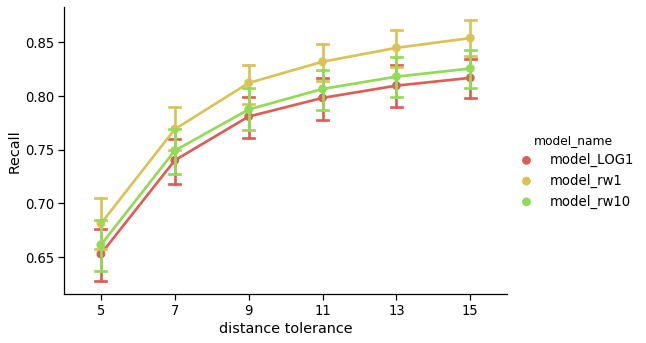

In [50]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'dst', 'rec', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='distance tolerance', ylabel='Recall')
# ax.savefig(join(figure_save_dir, 'rec_against_dst_diff_models.png'))

In [53]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'dst':9,'dil_sum':1, 'glength':1, 'intp':-1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'cutoff', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='cutoff', ylabel='F1 score')
# ax.savefig(join(figure_save_dir, 'f1_against_cutoff_diff_models_dst9.png'))

total_num_var 7


ValueError: min() arg is an empty sequence

In [494]:
df

,data_name,dst,model_name,cutoff,dil_sum,glength,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,model_LOG1,1.0,1.0,1.0,1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,model_LOG1,1.0,1.0,1.0,1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,model_LOG1,1.0,1.0,1.0,1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,model_LOG1,1.0,1.0,1.0,1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,model_LOG1,1.0,1.0,1.0,1.0,0.6845,0.7559,0.6255
...,...,...,...,...,...,...,...,...,...,...
5749,III_Soil_3D_DAP15,7,model_rw1000,1.0,1.5,1.0,1.0,0.6462,0.7547,0.5649
5750,III_Soil_3D_DAP15,9,model_rw1000,1.0,1.5,1.0,1.0,0.6765,0.7901,0.5914
5751,III_Soil_3D_DAP15,11,model_rw1000,1.0,1.5,1.0,1.0,0.6947,0.8113,0.6073
5752,III_Soil_3D_DAP15,13,model_rw1000,1.0,1.5,1.0,1.0,0.7054,0.8239,0.6167


In [522]:
# change the abbreviated names to the formal ones
df.loc[:,'model_name'] = df.loc[:,'model_name'].replace(['model_LOG1', 'model_rw1', 'model_rw10', 'model_rw100', 'model_rw1000'], 
                                     ['LOG1', 'root weight 1', 'root weight 10', 'root weight 100', 'root weight 1000'])
df = df.rename(columns={"model_name": "model name", "data_name":"data name", "dst":"distance tolerance",
                        "glength":"gap length", "dil_sum":"dilation multiplier"})
df

,data name,distance tolerance,model name,cutoff,dilation multiplier,gap length,intp,f1,pre,rec
0,III_Sand_1W_DAP8,5,LOG1,1.0,1.0,1.0,1.0,0.4362,0.4817,0.3986
1,III_Sand_1W_DAP8,7,LOG1,1.0,1.0,1.0,1.0,0.5241,0.5787,0.4789
2,III_Sand_1W_DAP8,9,LOG1,1.0,1.0,1.0,1.0,0.5907,0.6523,0.5398
3,III_Sand_1W_DAP8,11,LOG1,1.0,1.0,1.0,1.0,0.6402,0.7069,0.5849
4,III_Sand_1W_DAP8,13,LOG1,1.0,1.0,1.0,1.0,0.6845,0.7559,0.6255
...,...,...,...,...,...,...,...,...,...,...
5749,III_Soil_3D_DAP15,7,root weight 1000,1.0,1.5,1.0,1.0,0.6462,0.7547,0.5649
5750,III_Soil_3D_DAP15,9,root weight 1000,1.0,1.5,1.0,1.0,0.6765,0.7901,0.5914
5751,III_Soil_3D_DAP15,11,root weight 1000,1.0,1.5,1.0,1.0,0.6947,0.8113,0.6073
5752,III_Soil_3D_DAP15,13,root weight 1000,1.0,1.5,1.0,1.0,0.7054,0.8239,0.6167


total_num_var 7


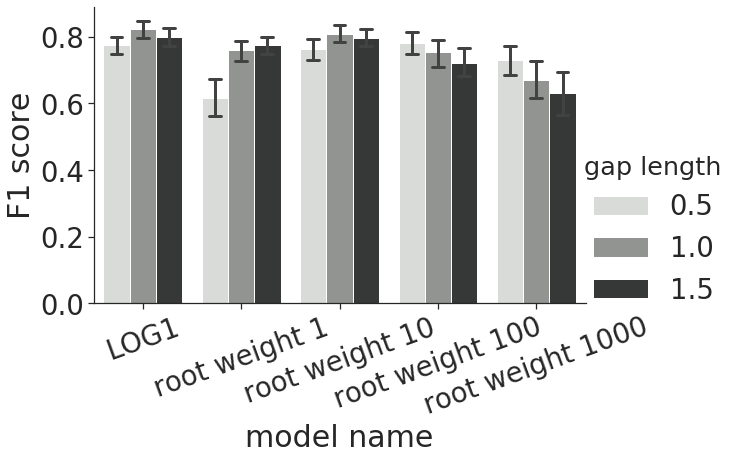

In [800]:
# set plot style
sns.set_context("notebook", font_scale=2.5)
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
# colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
colors = ['light grey', 'grey', 'dark grey']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .12
PLOT_TYPE = 'bar'  # 'point', 'bar'
HEIGHT = 6
ERR_WIDTH = 3

# the variables
dict_other_var_fix = {'distance tolerance':15,'dilation multiplier':1, 'cutoff':1, 'intp':1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'gap length' # 'data_name'
error_var_list = ['data name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'model name', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(ylabel='F1 score')

ax.set_xticklabels(rotation=20)

# ax.savefig(join(figure_save_dir, 'paper', 'f1_against_models_diff_glength_dst15.png'))


total_num_var 7


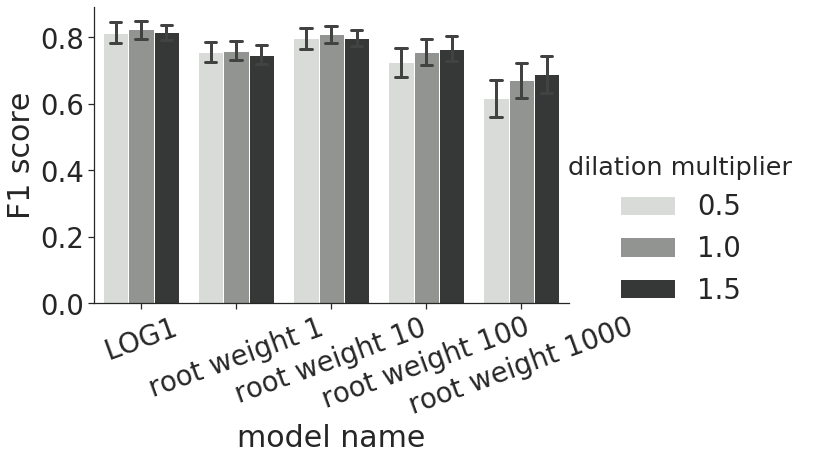

In [801]:
# set plot style
sns.set_context("notebook", font_scale=2.5)  # before: 1.7
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
# colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
colors = ['light grey', 'grey', 'dark grey']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .12
PLOT_TYPE = 'bar'  # 'point', 'bar'
HEIGHT = 6
ERR_WIDTH = 3

# the variables
dict_other_var_fix = {'distance tolerance':15,'gap length':1, 'cutoff':1, 'intp':1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'dilation multiplier' # 'data_name'
error_var_list = ['data name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'model name', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(ylabel='F1 score')

ax.set_xticklabels(rotation=20)

# ax.savefig(join(figure_save_dir, 'paper', 'f1_against_models_diff_dilatMult_dst15.png'))


total_num_var 7


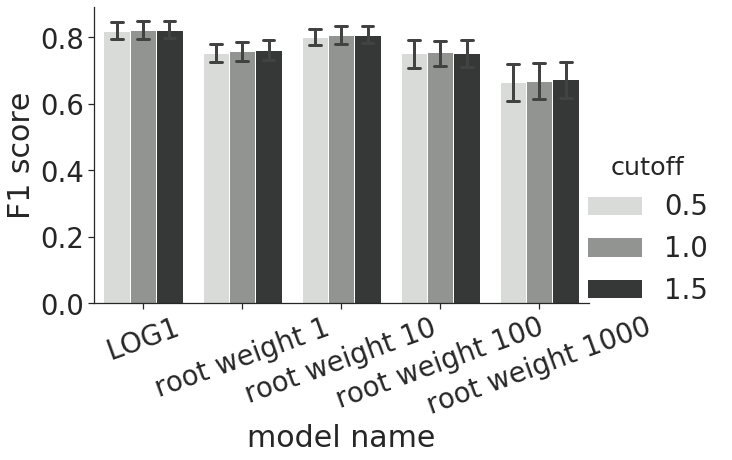

In [802]:
# set plot style
sns.set_context("notebook", font_scale=2.5)
# sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
# colors = ['pinkish', 'light green', 'aqua green', 'light forest green', 'dark green']
colors = ['light grey', 'grey', 'dark grey']
sns.set_palette(sns.xkcd_palette(colors))
ASPECT = 1.5
CAPSIZE = .12
PLOT_TYPE = 'bar'  # 'point', 'bar'
HEIGHT = 6
ERR_WIDTH = 3

# the variables
dict_other_var_fix = {'distance tolerance':15,'gap length':1, 'dilation multiplier':1, 'intp':1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'cutoff' # 'data_name'
error_var_list = ['data name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'model name', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(ylabel='F1 score')

ax.set_xticklabels(rotation=20)

# ax.savefig(join(figure_save_dir, 'paper', 'f1_against_models_diff_cutoff_dst15.png'))


total_num_var 7


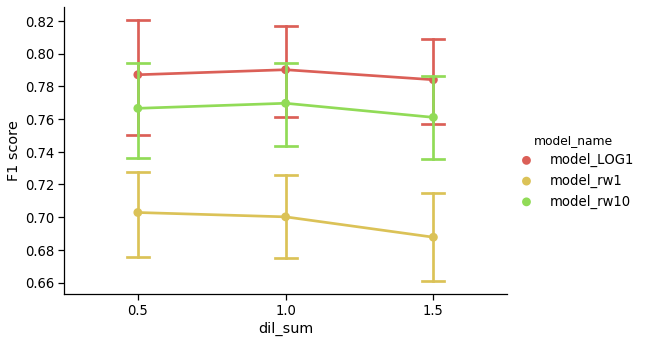

In [257]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'dst':9,'cutoff':1, 'glength':1, 'intp':-1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'dil_sum', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='dil_sum', ylabel='F1 score')
# ax.savefig(join(figure_save_dir, 'f1_against_dil_sum_diff_models_dst9.png'))

total_num_var 7


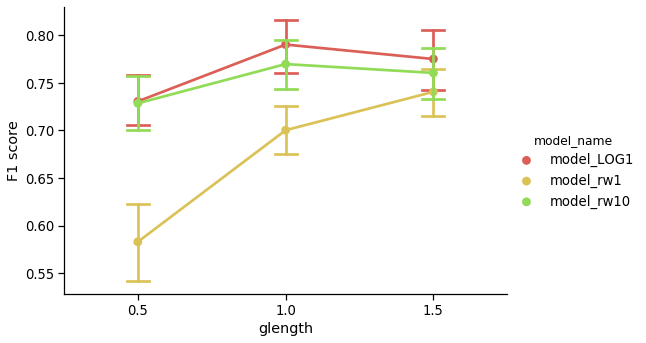

In [271]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'dst':9,'cutoff':1, 'dil_sum':1, 'intp':-1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['data_name']  # 'dil_sum', 'glength', 'intp'

# exclude lupine_small_xml because the parameter 'glength' for it only takes the value 0
ax = plot_x_against_y(df.loc[df['data_name']!='lupine_small_xml'], 'glength', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='glength', ylabel='F1 score')
# ax.savefig(join(figure_save_dir, 'f1_against_glength_diff_models_dst9_withoutLupineSmall.png'))

### Plot the effect of each param for each data, compare between 3 models

total_num_var 7
total_num_var 7
total_num_var 7


Text(0.5, 0.98, 'III_Sand_1W_DAP8')

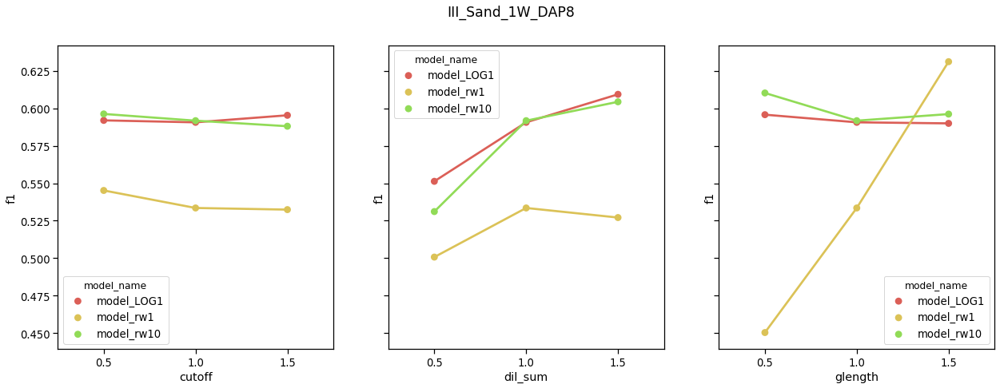

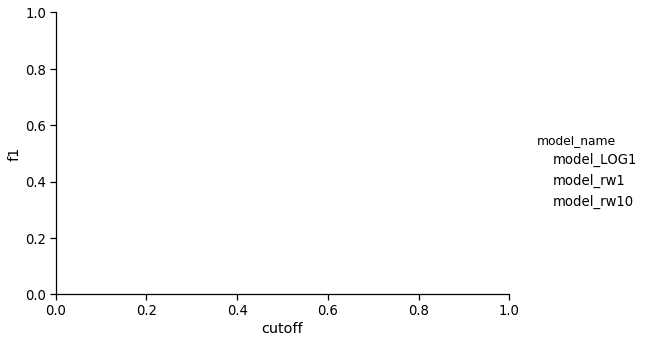

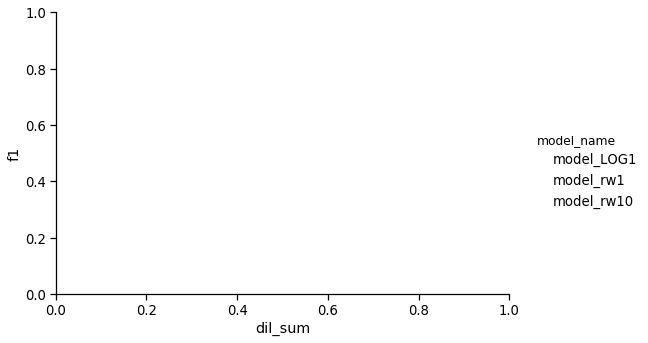

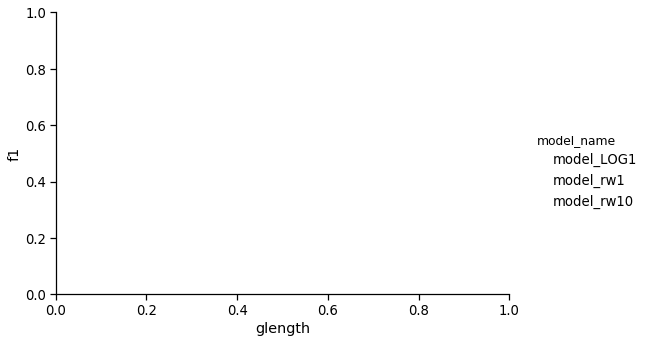

In [269]:
# # set plot style
# sns.set_context("notebook", font_scale=1.2)
# # sns.set_palette("Blues")
# sns.set_palette(sns.color_palette("hls", 8))
# ASPECT = 1.5
# CAPSIZE = .15
# PLOT_TYPE = 'point'  # 'point', 'bar'

# data_name = 'III_Sand_1W_DAP8'
# f, axes = plt.subplots(1, 3, figsize=(21, 7), sharey=True)
# subplot_i = 0
# for par in PARAMS:
#     if par!='intp':
#         # the variables
#         dict_other_var_fix = {'data_name': data_name, 'dst':9, 'intp':-1}  # {'model_name':'model_LOG1'}  
#         for p2 in PARAMS:
#             if p2!=par and p2!='intp':  # fix the other params except the param of interest and 'intp' (which has only one value -1)
#                 dict_other_var_fix[p2] = 1
#         # 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
#         # cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
#         hue_var = 'model_name' # 'data_name'
#         error_var_list = []  # 'dil_sum', 'glength', 'intp'

#         plot_x_against_y(df, par, 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list, axis=axes[subplot_i])
#         subplot_i += 1
        
# # f.set(xlabel=par, ylabel='F1 score', title=data_name)
# f.suptitle(data_name)
         
#         # ax.savefig(join(figure_save_dir, 'f1_against_glength_diff_models_dst9_withoutLupineSmall.png'))

In [ ]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
# sns.set_palette("Blues")
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.5
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'dst':9,'dil_sum':1, 'glength':1, 'intp':-1}  # {'model_name':'model_LOG1'}  
# 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', 
# cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name' # 'data_name'
error_var_list = ['data_name']  # 'dil_sum', 'glength', 'intp'

ax = plot_x_against_y(df, 'cutoff', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)
ax.set(xlabel='cutoff', ylabel='F1 score')
# ax.savefig(join(figure_save_dir, 'f1_against_cutoff_diff_models.png'))

total_num_var 7


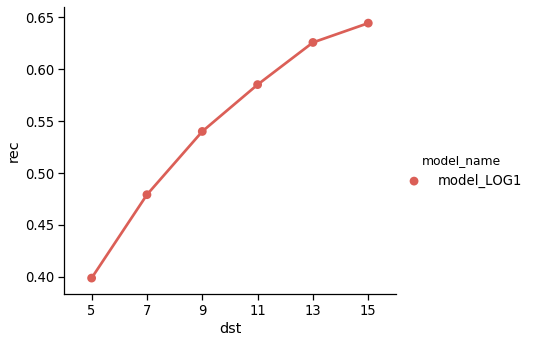

In [122]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 1.2
CAPSIZE = .15
PLOT_TYPE = 'point'  # 'point', 'bar'

# the variables
dict_other_var_fix = {'data_name': 'III_Sand_1W_DAP8'}  # 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp']

plot_x_against_y(df, 'dst', 'rec', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)

total_num_var 7


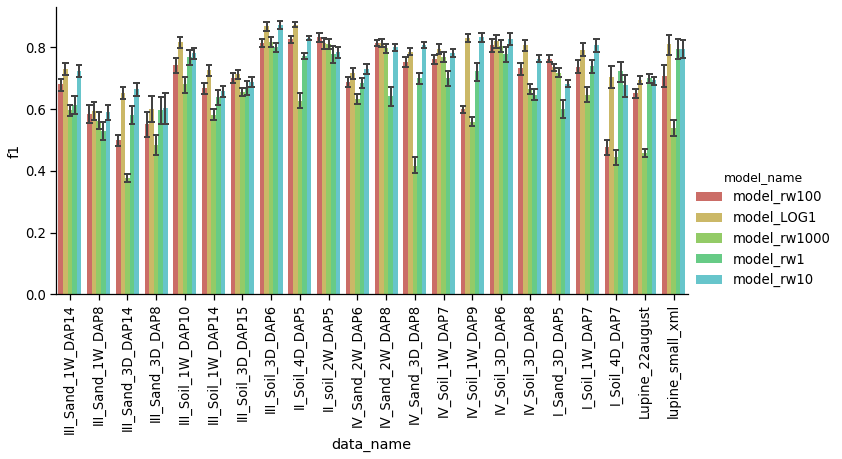

In [275]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
sns.set_palette(sns.color_palette("hls", 8))
ASPECT = 2
CAPSIZE = .15
PLOT_TYPE = 'bar'  # 'point', 'bar'
ERR_WIDTH = 2

# the variables
dict_other_var_fix = {}  # 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'model_name'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp', 'dst']

ax = plot_x_against_y(df.sort_values(by=['data_name']), 'data_name', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)

ax.set_xticklabels(rotation=90)

total_num_var 7


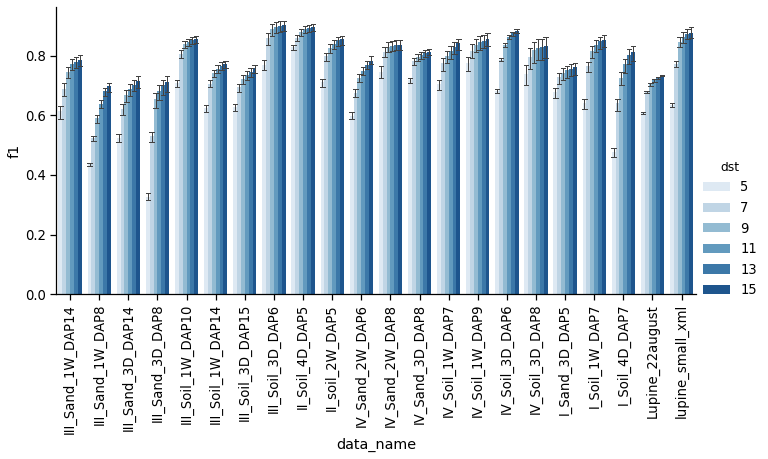

In [276]:
# set plot style
sns.set_context("notebook", font_scale=1.2)
sns.set_palette("Blues")
ASPECT = 2
CAPSIZE = .15
PLOT_TYPE = 'bar'  # 'point', 'bar'
ERR_WIDTH = 1


# the variables
dict_other_var_fix = {'model_name':'model_LOG1'}  # 'model_name':'model_LOG1', 'data_name': 'III_Sand_1W_DAP8', cutoff':100, 'dil_sum':1.95, 'glength':10, 'intp':-1.00
hue_var = 'dst'
error_var_list = ['cutoff', 'dil_sum', 'glength', 'intp']

ax = plot_x_against_y(df.sort_values(by=['data_name']), 'data_name', 'f1', dict_other_var_fix, hue_var=hue_var, error_var_list=error_var_list)

ax.set_xticklabels(rotation=90)

[False False False False False False  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True]
[False False False False False False False  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True]
[False False False False False False False False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True]
[False False False False False False False False False False False False
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True]


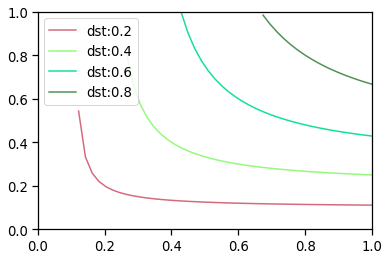

In [95]:
def graph(formula, x_range, dst_list):  
    x = np.array(x_range)  
    for dst in dst_list:
        y = formula(x, dst)  # <- note now we're calling the function 'formula' with x
        valid_range = (y>=0)&(y<=1)
        print(valid_range)
        x = x[valid_range]
        y = y[valid_range]
        plt.plot(x, y, label='dst:{}'.format(dst))  
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.legend()
    plt.show()  

def my_formula(x, dst):
    return dst*x/(2*x-dst)

graph(my_formula, np.linspace(0.0001, 1.0, num=50), [0.2, 0.4, 0.6, 0.8])